# **Employee Attrition Analysis**

**Group Members:** Michael DeMasi, Katherine Yang, Tolani Oshinusi, Jeremy Cho

### **Project Summary**
This project aims to analyze and predict factors influencing employee attrition. It utilizes a dataset comprising 74,610 employee records, each identified by a unique Employee ID and containing features relevant to employee attrition. The dataset provides comprehensive information about employees' demographics, job-related attributes, and personal circumstances, offering a realistic view of the factors affecting employee retention.

Additionally, the project will explore employee sentiment by extracting reviews from [CareerBliss](https://www.careerbliss.com/). Using NLP models, we will analyze the sentiment of these reviews to determine if companies with higher turnover rates receive more negative feedback compared to those with lower turnover rates. The code for extracting reviews is found in a supplemental notebook called "Web_Scraping".

**Note:** GPU should be used for optimal runtime of the Flair NLP model.

**Dataset**: [Employee Attrition Dataset](https://www.kaggle.com/datasets/nikhilbhosle/employee-attrition-uncleaned-dataset)

### **Motivation**
Employee attrition poses significant challenges for organizations, including high replacement costs, loss of institutional knowledge, and disruptions in team dynamics. Understanding the key drivers behind attrition can help organizations identify at-risk employees and implement strategies to improve retention.

By exploring this dataset, we aim to uncover insights into the factors contributing to employee attrition and build predictive models to proactively address retention challenges.

### **Approach**
- **Part 1: Data Wrangling and Cleaning**:
  - Clean and preprocess the dataset by handling missing and duplicate values for analysis and modeling.

- **Part 2: Exploratory Data Analysis (EDA)**:
  - Encode categorical variables to generate summary statistics, visualizations, and correlation analyses to understand patterns and trends in attrition.
  - Explore demographic and job-related attributes to identify at-risk groups.

- **Part 3: Employee Review Analysis**:
  - Scrape employee reviews from multiple high attrition companies and low attrition companies and perform a sentiment analysis using NLP
  - Perform EDA to identify any correlation between attrition and employee review sentiment

- **Part 4: Modeling with Machine Learning**:
  - Train machine learning models, such as Random Forest, Logistic Regression, and Gradient Boosted Trees to predict employee attrition.
  - Evaluate model accuracy, precision, recall, and other metrics to ensure reliable performance.
  - Analyze feature importance to interpret the drivers of attrition.

# **Part 0: Import Libraries and Data**

In [ ]:
# Pip install required libraries
!pip install pandasql --quiet
!pip install kagglehub --quiet
!pip install plotly --quiet
!pip install seaborn --quiet

In [ ]:
import pandas as pd
import pandasql as ps
import numpy as np
import kagglehub
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Import plotly for interactive plots
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Suppress any warnings for clean printing
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Download the dataset
path = kagglehub.dataset_download("nikhilbhosle/employee-attrition-uncleaned-dataset")
file_path = os.path.join(path, 'Emp_attrition_csv.csv')

# Load the data into a pandas DataFrame
df = pd.read_csv(file_path)

# **Part 1: Data Wrangling and Cleaning**

In this section we will first clean up the dataset by removing any null or duplicate values, then we will explore the properties and types of variables in the dataset.

In [ ]:
# View the first 5 rows of the dataset
df.head()

,Employee ID,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,...,Number of Dependents,Job Level,Company Size,Company Tenure (In Months),Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
0,8410,31,Male,19,Education,5390,Excellent,Medium,Average,2,...,0,Mid,Medium,89.0,No,No,No,Excellent,Medium,Stayed
1,64756,59,Female,4,Media,5534,Poor,High,Low,3,...,3,Mid,Medium,21.0,No,No,No,Fair,Low,Stayed
2,30257,24,Female,10,Healthcare,8159,Good,High,Low,0,...,3,Mid,Medium,74.0,No,No,No,Poor,Low,Stayed
3,65791,36,Female,7,Education,3989,Good,High,High,1,...,2,Mid,Small,50.0,Yes,No,No,Good,Medium,Stayed
4,65026,56,Male,41,Education,4821,Fair,Very High,Average,0,...,0,Senior,Medium,68.0,No,No,No,Fair,Medium,Stayed


In [ ]:
# Visualize dataframe properties and types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74610 entries, 0 to 74609
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Employee ID                 74610 non-null  int64  
 1   Age                         74610 non-null  int64  
 2   Gender                      74610 non-null  object 
 3   Years at Company            74610 non-null  int64  
 4   Job Role                    74610 non-null  object 
 5   Monthly Income              74610 non-null  int64  
 6   Work-Life Balance           74610 non-null  object 
 7   Job Satisfaction            74610 non-null  object 
 8   Performance Rating          74610 non-null  object 
 9   Number of Promotions        74610 non-null  int64  
 10  Overtime                    74610 non-null  object 
 11  Distance from Home          72698 non-null  float64
 12  Education Level             74610 non-null  object 
 13  Marital Status              746

In [ ]:
# Check for nulls
na_rows_count = df.isnull().any(axis=1).sum()
print(f"Number of rows with NaN values: {na_rows_count}\n")

# Drop nulls
df = df.dropna().reset_index(drop=True)
df.info()

Number of rows with NaN values: 3975

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70635 entries, 0 to 70634
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Employee ID                 70635 non-null  int64  
 1   Age                         70635 non-null  int64  
 2   Gender                      70635 non-null  object 
 3   Years at Company            70635 non-null  int64  
 4   Job Role                    70635 non-null  object 
 5   Monthly Income              70635 non-null  int64  
 6   Work-Life Balance           70635 non-null  object 
 7   Job Satisfaction            70635 non-null  object 
 8   Performance Rating          70635 non-null  object 
 9   Number of Promotions        70635 non-null  int64  
 10  Overtime                    70635 non-null  object 
 11  Distance from Home          70635 non-null  float64
 12  Education Level             70635 non-null  object

In [ ]:
# Check for duplicate rows
duplicate_count = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_count}\n")

# Remove duplicate rows
df = df.drop_duplicates()
df = df.reset_index(drop=True)
df.info()

Number of duplicate rows: 77

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70558 entries, 0 to 70557
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Employee ID                 70558 non-null  int64  
 1   Age                         70558 non-null  int64  
 2   Gender                      70558 non-null  object 
 3   Years at Company            70558 non-null  int64  
 4   Job Role                    70558 non-null  object 
 5   Monthly Income              70558 non-null  int64  
 6   Work-Life Balance           70558 non-null  object 
 7   Job Satisfaction            70558 non-null  object 
 8   Performance Rating          70558 non-null  object 
 9   Number of Promotions        70558 non-null  int64  
 10  Overtime                    70558 non-null  object 
 11  Distance from Home          70558 non-null  float64
 12  Education Level             70558 non-null  object 
 13  M

In [ ]:
# Get number of unique values for each column in the dataset
for column in df.columns:
    unique_count = df[column].nunique()

    # Print unique items as a list if there are fewer than 10
    if unique_count < 10:
        unique_items = df[column].unique().tolist()
        if isinstance(unique_items[0], int): unique_items = sorted(unique_items)
        print(f"{column}: {unique_count} unique values: {unique_items}")
    else:
      print(f"{column}: {unique_count} unique values")

Employee ID: 70558 unique values
Age: 42 unique values
Gender: 2 unique values: ['Male', 'Female']
Years at Company: 51 unique values
Job Role: 5 unique values: ['Education', 'Media', 'Healthcare', 'Technology', 'Finance']
Monthly Income: 9778 unique values
Work-Life Balance: 4 unique values: ['Excellent', 'Poor', 'Good', 'Fair']
Job Satisfaction: 4 unique values: ['Medium', 'High', 'Very High', 'Low']
Performance Rating: 4 unique values: ['Average', 'Low', 'High', 'Below Average']
Number of Promotions: 5 unique values: [0, 1, 2, 3, 4]
Overtime: 2 unique values: ['No', 'Yes']
Distance from Home: 99 unique values
Education Level: 5 unique values: ['Associate Degree', 'Masterâ€™s Degree', 'Bachelorâ€™s Degree', 'High School', 'PhD']
Marital Status: 3 unique values: ['Married', 'Divorced', 'Single']
Number of Dependents: 8 unique values: [0, 1, 2, 3, 4, 5, 6, 15]
Job Level: 3 unique values: ['Mid', 'Senior', 'Entry']
Company Size: 3 unique values: ['Medium', 'Small', 'Large']
Company Tenu

Notice the odd characters and inconsistant naming within `Education Level` - rename these items for clarity. Also rename the column `Company Tenure (In Months)` to just `Company Tenure` for simplicity.

In [ ]:
# Replace values containing "Master" with "Masters"
df.loc[df['Education Level'].str.contains('Master', na=False), 'Education Level'] = "Masters"

# Replace values containing "Bachelor" with "Bachelors"
df.loc[df['Education Level'].str.contains('Bachelor', na=False), 'Education Level'] = "Bachelors"

# Replace values containing "Associate" with "Associates"
df.loc[df['Education Level'].str.contains('Associate', na=False), 'Education Level'] = "Associates"

# Rename the Company Tenure (In Months) column
df = df.rename(columns={"Company Tenure (In Months)": "Company Tenure"})

# Confirm the new names for the Education Levels
unique_items = df['Education Level'].unique().tolist()
print(f"{'Education Level'}: {unique_items}")

Education Level: ['Associates', 'Masters', 'Bachelors', 'High School', 'PhD']


In [ ]:
# View the first 5 rows of the dataset and save to original_df
original_df = df.copy()
df.head()

,Employee ID,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,...,Number of Dependents,Job Level,Company Size,Company Tenure,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
0,8410,31,Male,19,Education,5390,Excellent,Medium,Average,2,...,0,Mid,Medium,89.0,No,No,No,Excellent,Medium,Stayed
1,64756,59,Female,4,Media,5534,Poor,High,Low,3,...,3,Mid,Medium,21.0,No,No,No,Fair,Low,Stayed
2,30257,24,Female,10,Healthcare,8159,Good,High,Low,0,...,3,Mid,Medium,74.0,No,No,No,Poor,Low,Stayed
3,65791,36,Female,7,Education,3989,Good,High,High,1,...,2,Mid,Small,50.0,Yes,No,No,Good,Medium,Stayed
4,65026,56,Male,41,Education,4821,Fair,Very High,Average,0,...,0,Senior,Medium,68.0,No,No,No,Fair,Medium,Stayed


## **1.1 Feature Classification**

From the results above we can divide the dataset into the following categories:

#### **Numerical Features**
- `Employee ID`: Unique identifier for each employee.  
- `Age`: Employee's age (18–60 years).  
- `Years at Company`: Years the employee has worked at the company.  
- `Monthly Income`: Employee's monthly salary (in dollars).  
- `Number of Promotions`: Total promotions received.  
- `Distance from Home`: Distance between home and workplace (in miles).  
- `Company Tenure`: Total months worked in the industry.  

#### **Categorical Features**
- `Gender`: [Male, Female]
- `Job Role`: [Finance, Healthcare, Technology, Education, Media]
- `Work-Life Balance`: [Poor, Below Average, Good, Excellent]
- `Job Satisfaction`: [Low, Medium, High, Very High]
- `Performance Rating`: [Low, Below Average, Average, High]
- `Education Level`: [High School, Associates, Bachelors, Masters, PhD]
- `Marital Status`: [Divorced, Married, Single]
- `Job Level`: [Entry, Mid, Senior]
- `Company Size`: [Small, Medium, Large]
- `Remote Work`: [Yes, No]  
- `Leadership Opportunities`: [Yes, No]  
- `Innovation Opportunities`: [Yes, No].  
- `Company Reputation`: [Poor, Fair, Good, Excellent]
- `Employee Recognition`: [Low, Medium, High, Very High]  

#### **Target Variable**
- `Attrition`: [Stayed, Left]


In [ ]:
# Statistics of Numerical Features
df.describe().drop('Employee ID', axis=1).T

,count,mean,std,min,25%,50%,75%,max
Age,70558.0,38.531506,12.082980,18.0,28.0,39.0,49.00,59.0
Years at Company,70558.0,15.721647,11.224501,1.0,7.0,13.0,23.00,51.0
Monthly Income,70558.0,7342.199510,2540.122125,1226.0,5657.0,7353.0,8879.75,50030.0
Number of Promotions,70558.0,0.831784,0.994624,0.0,0.0,1.0,2.00,4.0
Distance from Home,70558.0,49.998129,28.526090,1.0,25.0,50.0,75.00,99.0
Number of Dependents,70558.0,1.653845,1.574910,0.0,0.0,1.0,3.00,15.0
Company Tenure,70558.0,55.723518,25.394266,2.0,36.0,56.0,76.00,128.0


In [ ]:
# Statistics of Categorical Features
df.describe(include='object').T

,count,unique,top,freq
Gender,70558,2,Male,38650
Job Role,70558,5,Technology,18323
Work-Life Balance,70558,4,Good,26659
Job Satisfaction,70558,4,High,35291
Performance Rating,70558,4,Average,42358
Overtime,70558,2,No,47536
Education Level,70558,5,Bachelors,21147
Marital Status,70558,3,Married,35481
Job Level,70558,3,Entry,28172
Company Size,70558,3,Medium,35286


**Observations:** Since there were not many NULLs or duplicate rows, we removed all duplicate rows and those containing NULLs since there is still plenty of data left in the dataset. There is no need for imputation, which can unnecessarily introduce bias.

# **Part 2: Exploratory Data Analysis (EDA)**

Here we will explore the data and analyze factors that may influence employee attrition. Below are some key points to consider:

   How do the distributions of key features such as age, salary, satisfaction, etc. look? We will visualize the distributions to understand how the data is spread and whether certain values are more prevalent among employees who leave versus those who stay.

   Which variables are strongly correlated with employee attrition? Are there any patterns that suggest which factors are most strongly linked to employees leaving the company?

We will answer these questions throughout this section based on our observations.



## **2.1 Distribution Visualizations**

### 2.1.1 Box Plots of Numerical Features

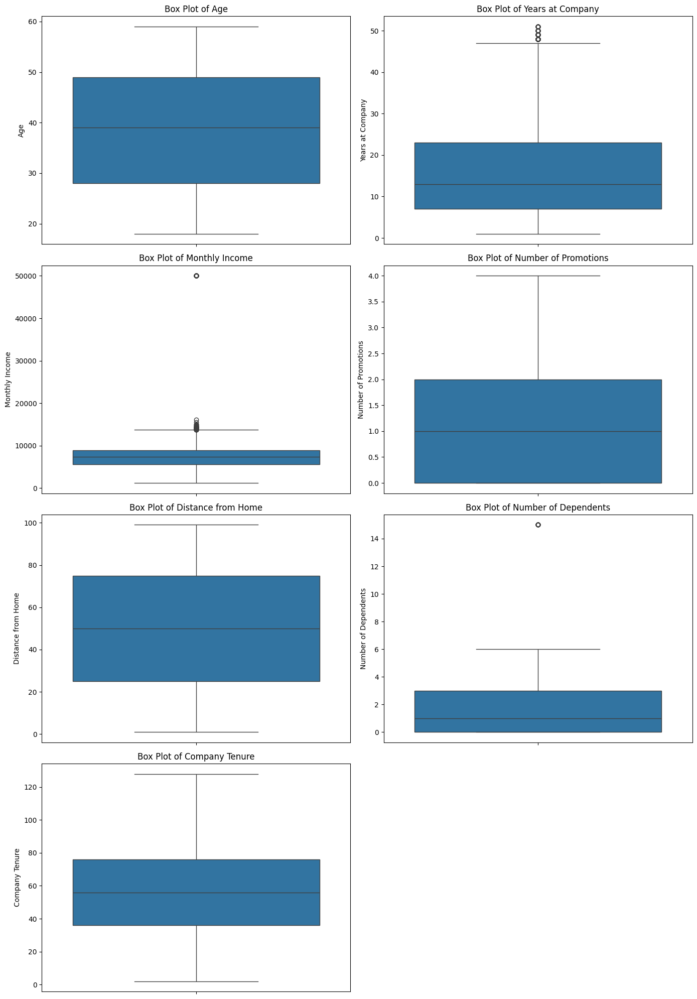

In [ ]:
# Create a Box Plot for each numerical feature
numeric_columns = df.select_dtypes(include=['number']).columns.tolist()
numeric_columns.remove('Employee ID')

num_columns = len(numeric_columns)
num_rows = (num_columns // 2) + (num_columns % 2)
fig, axes = plt.subplots(num_rows, 2, figsize=(14, num_rows * 5))
axes = axes.flatten()

for ax, col in zip(axes, numeric_columns):
    sns.boxplot(data=df, y=col, ax=ax)
    ax.set_title(f'Box Plot of {col}')

for i in range(num_columns, len(axes)):
    axes[i].axis('off')

# Display the plots
plt.tight_layout()
plt.show()

### 2.1.2 Distributions of Numerical Features

In [ ]:
# Create histograms for the numerical columns
columns_to_plot = df.select_dtypes(include=['number']).drop(columns=['Employee ID'])

n_rows, n_cols = 3, 3

# make subplots
fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    subplot_titles=list(map(lambda x: x.replace('_', ' '), columns_to_plot.columns.tolist()))
)

for i, col in enumerate(columns_to_plot):
    row_idx = i // n_cols + 1
    col_idx = i % n_cols + 1
    hist = go.Histogram(
        x=df[col],
        nbinsx=10,
        name=col,
        marker=dict(
            line=dict(
              color='black',
              width=1
          )
        )
      )
    fig.add_trace(hist, row=row_idx, col=col_idx)

fig.update_layout(
    height=400 * n_rows,
    width=400 * n_cols,
    title={'x': 0.5},
    title_text="Distributions of Numerical Features",
    showlegend=False
)

fig.show()

### 2.1.3 Distributions of Categorical Features

In [ ]:
# Create histograms for categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

n_rows, n_cols = 4, 4

# make subplots
fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    subplot_titles=[col.replace('_', ' ') for col in categorical_columns]
)

for i, col in enumerate(categorical_columns):
    row_idx = i // n_cols + 1
    col_idx = i % n_cols + 1

    counts = df[col].value_counts()
    bar = go.Bar(x=counts.index,
                 y=counts.values,
                 name=col,
                 marker=dict(
                     line=dict(
                         color='black',
                         width=1
                         )
                     )
                 )

    fig.add_trace(bar, row=row_idx, col=col_idx)

fig.update_layout(
    height=300 * n_rows,
    width=300 * n_cols,
    title={'x': 0.5},
    title_text="Distribution of Categorical Features",
    showlegend=False
)

fig.show()


---
**Observations**

Numerical Features:
- There is about an even distribution of `Age` (from 20-60) and `Distance from Home` for all employees
- There are decreasingly less employees as `Years at Company`, `Number of Promotions`, and `Number of Dependents` increase
- The majority of employees make a `Montly Income` of 5-10k, with a few outliers making over 50k
- Outliers exist on the high end of `Monthly Income`, `Years at Company`, and `Number of Dependents`


Categorical Features:
- Majority rate `Work-Life Balance` & `Job Satisfaction` as "Good" or "High."
- ~30% hold a Bachelor's degree, the most common education level.
- Most employees do not work remotely or work overtime.
- Overwhelming majority report "No" in `Leadership Opportunities` & `Innovation Opportunities`.
- The number of employees who "Stayed" and "Left" (from `Attrition`) is relatively balanced. We have over 30K data points in each category, which means that we will not need to oversample or undersample the data later on.



## **2.2 Feature Encoding**

Convert categorical columns to numerical using Label Encoding. This will be used to generate the correlation maxtrix heatmap below, but for modeling we will use a mixture of label and one-hot-encoding.

In [ ]:
df_encoded = df.copy()
category_mappings = {}

# Convert object columns to numerical using Label Encoding
for col in df_encoded.select_dtypes(include='object').columns:
    df_encoded[col] = df_encoded[col].astype('category')
    category_mappings[col] = dict(enumerate(df_encoded[col].cat.categories))
    df_encoded[col] = df_encoded[col].cat.codes

# Change order for specific columns
manual_order = {
    'Company Reputation': ['Poor', 'Fair', 'Good', 'Excellent'],
    'Employee Recognition': ['Low', 'Medium', 'High', 'Very High'],
    'Work-Life Balance': ['Poor', 'Fair', 'Good', 'Excellent'],
    'Job Satisfaction': ['Low', 'Medium', 'High', 'Very High'],
    'Performance Rating': ['Low', 'Below Average', 'Average', 'High'],
    'Education Level': ['High School', 'Associates', 'Bachelors', 'Masters', 'PhD'],
    'Job Level': ['Entry', 'Mid', 'Senior'],
    'Company Size': ['Small', 'Medium', 'Large'],
    'Attrition': ['Stayed', 'Left']
}

# Adjust mappings for manually ordered columns
for col, order in manual_order.items():
    df_encoded[col] = pd.Categorical(df[col], categories=order, ordered=True).codes
    category_mappings[col] = dict(enumerate(order))

# Print the mappings
for col, mapping in category_mappings.items():
    print(f"Column '{col}': {mapping}")

# Sanity check for categorical columns replaced by numbers
df_encoded.head()

Column 'Gender': {0: 'Female', 1: 'Male'}
Column 'Job Role': {0: 'Education', 1: 'Finance', 2: 'Healthcare', 3: 'Media', 4: 'Technology'}
Column 'Work-Life Balance': {0: 'Poor', 1: 'Fair', 2: 'Good', 3: 'Excellent'}
Column 'Job Satisfaction': {0: 'Low', 1: 'Medium', 2: 'High', 3: 'Very High'}
Column 'Performance Rating': {0: 'Low', 1: 'Below Average', 2: 'Average', 3: 'High'}
Column 'Overtime': {0: 'No', 1: 'Yes'}
Column 'Education Level': {0: 'High School', 1: 'Associates', 2: 'Bachelors', 3: 'Masters', 4: 'PhD'}
Column 'Marital Status': {0: 'Divorced', 1: 'Married', 2: 'Single'}
Column 'Job Level': {0: 'Entry', 1: 'Mid', 2: 'Senior'}
Column 'Company Size': {0: 'Small', 1: 'Medium', 2: 'Large'}
Column 'Remote Work': {0: 'No', 1: 'Yes'}
Column 'Leadership Opportunities': {0: 'No', 1: 'Yes'}
Column 'Innovation Opportunities': {0: 'No', 1: 'Yes'}
Column 'Company Reputation': {0: 'Poor', 1: 'Fair', 2: 'Good', 3: 'Excellent'}
Column 'Employee Recognition': {0: 'Low', 1: 'Medium', 2: 'High'

,Employee ID,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,...,Number of Dependents,Job Level,Company Size,Company Tenure,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
0,8410,31,1,19,0,5390,3,1,2,2,...,0,1,1,89.0,0,0,0,3,1,0
1,64756,59,0,4,3,5534,0,2,0,3,...,3,1,1,21.0,0,0,0,1,0,0
2,30257,24,0,10,2,8159,2,2,0,0,...,3,1,1,74.0,0,0,0,0,0,0
3,65791,36,0,7,0,3989,2,2,3,1,...,2,1,0,50.0,1,0,0,2,1,0
4,65026,56,1,41,0,4821,1,3,2,0,...,0,2,1,68.0,0,0,0,1,1,0


## **2.3 Correlation Heatmap**

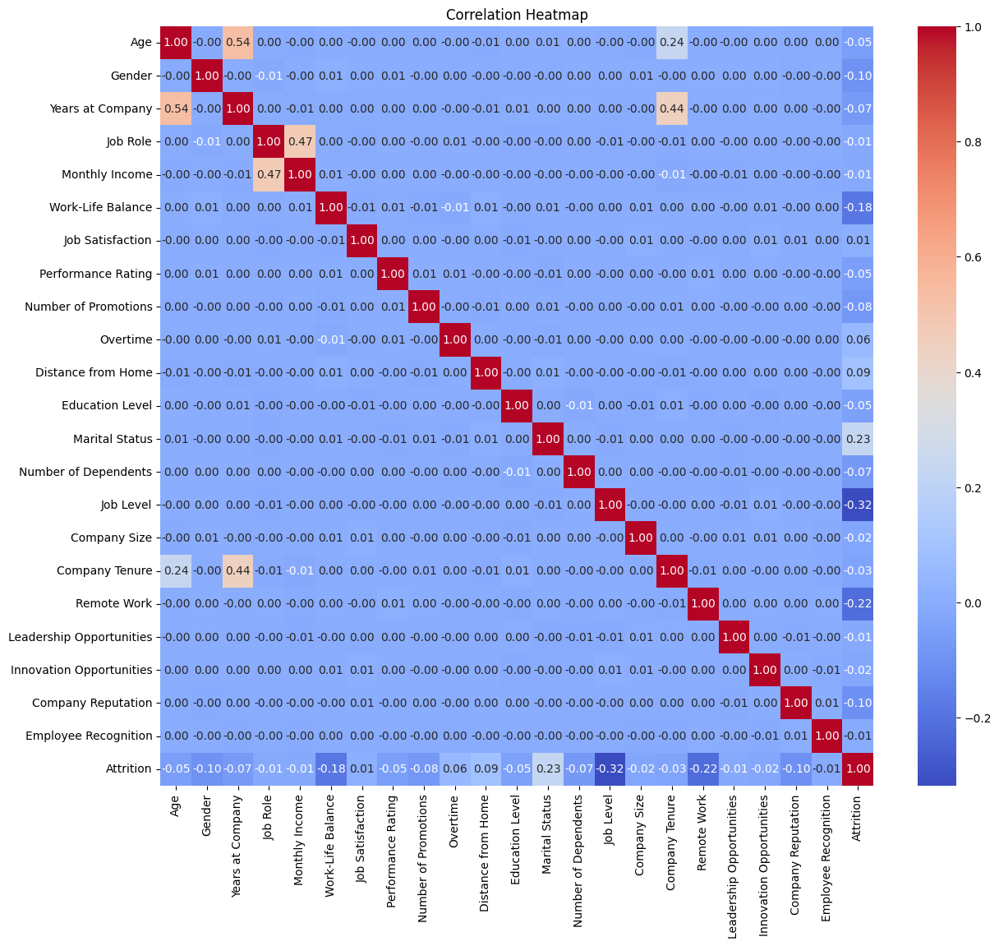

In [ ]:
correlation_matrix = df_encoded.drop(columns=['Employee ID']).corr()
correlation_matrix
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Correlation Heatmap')
plt.show()

---
**Observations**

1. Most Significant Negative Correlations with Attrition:
   - **Job Level (-0.32)**: Employees in higher job levels are less likely to leave, indicating the importance of career growth opportunities.
   - **Remote Work (-0.22)**: Employees with remote work flexibility tend to stay with the company, suggesting flexibility is a retention factor.
   - **Work-Life Balance (-0.18)**: A better work-life balance correlates with reduced attrition, emphasizing the need to foster a balanced environment.
   - **Gender (-0.10)**: Gender has a negative correlation, possibly reflecting different retention trends across genders.
   - **Company Reputation (-0.10)**: A well-regarded company reputation helps lower attrition rates.
   - **Number of Promotions (-0.08)**: Employees with more promotions are less likely to leave, highlighting the importance of internal career progression.
   - **Years at Company (-0.07)**: Longer tenure correlates with reduced attrition, suggesting loyalty builds over time.
   - **Number of Dependents (-0.07)**: Employees with dependents may prefer stability, contributing to lower attrition.
   - **Performance Rating (-0.05)**: Higher performance ratings correlate weakly with reduced attrition.
   - **Education Level (-0.05)**: Employees with higher education levels are slightly less likely to leave.
   - **Age (-0.05)**: Older employees tend to stay longer, reflecting stability in later career stages.

2. Most Significant Positive Correlations with Attrition:
   - **Marital Status (0.23)**: Certain marital statuses may correlate with higher attrition, potentially due to life changes or responsibilities.
   - **Distance from Home (0.09)**: Employees living farther from the workplace may find it less convenient, leading to higher attrition.
   - **Overtime (0.06)**: Overtime work correlates with higher attrition, possibly due to burnout or dissatisfaction.

3. Insignificant or Neutral Factors with Attrition:
   - Several attributes, such as Job Role, Job Satisfaction, Monthly Income, Leadership Opportunities, or Employee Recognition show very weak or no meaningful correlation with attrition.

4. Other Notable Correlations:
   - **Monthly Income vs. Job Role (0.47)**: Employees in roles with higher job levels tend to earn significantly more, reflecting standard pay structures.
   - **Years at Company vs. Age (0.54)**: Older employees naturally tend to have longer tenures, indicating consistency with expected career progression.
   - **Company Tenure vs. Years at Company (0.44)**: Employees with higher tenure scores align with their years at the company.

## **2.4 Categorical Features vs. Attrition**

 Plot all of the categorical features against attrition

In [ ]:
categorical_columns = df.select_dtypes(include=['object']).drop(columns=['Attrition']).columns.tolist()

for col in categorical_columns:
    colOrder = []
    if col == 'Work-Life Balance':
        colOrder = ['Poor', 'Fair', 'Good', 'Excellent']
    elif col == 'Job Satisfaction':
        colOrder = ['Low', 'Medium', 'High', 'Very High']
    elif col == 'Performance Rating':
        colOrder = ['Low', 'Below Average', 'Average', 'High']
    elif col == 'Education Level':
        colOrder = ['High School', 'Associates', 'Bachelors', 'Masters', 'PhD']
    elif col == 'Job Level':
        colOrder = ['Entry', 'Mid', 'Senior']
    elif col == 'Company Size':
        colOrder = ['Small', 'Medium', 'Large']
    elif col == 'Company Reputation':
        colOrder = ['Poor', 'Fair', 'Good', 'Excellent']
    elif col == 'Employee Recognition':
        colOrder = ['Low', 'Medium', 'High', 'Very High']

    fig = px.histogram(df, x=col, color='Attrition', barmode='group',
                       title=f'{col} vs Attrition',
                       labels={col: col, 'Attrition': 'Attrition'},
                       category_orders={col: colOrder} if colOrder else {})

    fig.update_layout(
        title_x=0.5
    )

    fig.show()


---
**Observations**

- Females tend to leave at a higher percentage than males
- Lower `Work-Life Balance` and `Company Reputation` ratings result in higher attrition rates
- `Remote Work` ability results in lower attrition rates
- Higher attrition rates for Entry `Job Level` as opposed to Mid or especially Senior levels
- Single `Marital Status` results in higher attrition rates compared to Married or Divorced
- `Overtime` results in higher attrition rates
- Lower `Performance Rating` slightly increses attrition rates
- `Job Role`, `Job Satisfaction`, `Education Level` (besides PhD - they tend to stay), `Company Size`, `Leadership Opportunites`, `Innovation Opportunities` and `Employee Recognition` do not have a noticable affect on attrition



## **2.5 Numerical Features vs. Attrition**

Plot all of the numerical features against attrition.

In [ ]:
''' Create buckets for select numerical columns for readability'''

# Copy df into a new dataframe and remove outliers
numerical_df = df.copy()
numerical_df = numerical_df[numerical_df['Monthly Income'] <= 40000]
numerical_df = numerical_df[numerical_df['Number of Dependents'] < 7]
numerical_df['Attrition'] = pd.Categorical(numerical_df['Attrition'], categories=['Stayed', 'Left'], ordered=True)

numerical_df['Age'] = pd.cut(numerical_df['Age'],
                          bins=range(18, numerical_df['Age'].max() + 5, 5),
                          labels=[f'{i}-{i+4}' for i in range(18, df['Age'].max(), 5)],
                          right=False)

numerical_df['Years at Company'] = pd.cut(numerical_df['Years at Company'],
                                       bins=range(0, numerical_df['Years at Company'].max() + 5, 5),
                                       labels=[f'{i}-{i+4}' for i in range(0, numerical_df['Years at Company'].max(), 5)],
                                       right=False)

numerical_df['Monthly Income'] = pd.cut(numerical_df['Monthly Income'],
                                     bins=range(2000, int(numerical_df['Monthly Income'].max()) + 2000, 2000),
                                     labels=[f'{i}-{i+1999}' for i in range(2000, int(numerical_df['Monthly Income'].max()), 2000)],
                                     right=False)

numerical_df['Distance from Home'] = pd.cut(numerical_df['Distance from Home'],
                                         bins=range(0, int(numerical_df['Distance from Home'].max()) + 10, 10),
                                         labels=[f'{i}-{i+9}' for i in range(0, int(numerical_df['Distance from Home'].max()), 10)],
                                         right=False)

numerical_df['Company Tenure'] = pd.cut(numerical_df['Company Tenure'],
                                     bins=range(0, int(numerical_df['Company Tenure'].max()) + 10, 10),
                                     labels=[f'{i}-{i+4}' for i in range(0, int(numerical_df['Company Tenure'].max()), 10)],
                                     right=False)

In [ ]:
# List of desired columns
numerical_columns = [
    'Age',
    'Years at Company',
    'Monthly Income',
    'Distance from Home',
    'Company Tenure',
    'Number of Promotions',
    'Number of Dependents'
]

# Plot each column
for col in numerical_columns:
    fig = px.bar(
        numerical_df.groupby([col, 'Attrition']).size().reset_index(name='Count'),
        x=col,
        y='Count',
        color='Attrition',
        barmode='group',
        title=f'Distribution of {col} vs Attrition',
        labels={col: col, 'Count': 'Number of Employees'}
    )
    fig.update_layout(title_x=0.5)
    fig.show()

---
**Observations**

- Younger employees tend to leave more than older ones
- People that stay at the company longer tend to leave less
- Employees with 3 or more promotions are less likely to leave
- Employees that live closer to work are much less likely to leave than employees living further away
- Employees with more dependents are slightly less likely to leave

## **2.6 Further Analysis**

What combinations of factors lead to attrition?

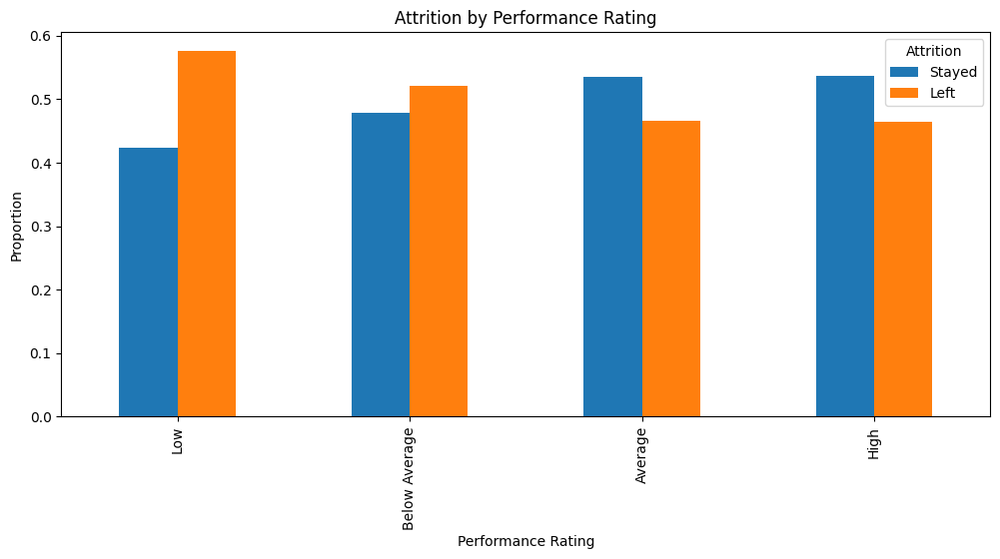

In [ ]:
''' Attrition by Performance Rating % '''

performance_attrition = df.groupby('Performance Rating')['Attrition'].value_counts(normalize=True).unstack()
performance_attrition = performance_attrition[["Stayed", "Left"]]
order = ['Low', 'Below Average', 'Average', 'High']
performance_attrition = performance_attrition.reindex(order)

performance_attrition.plot(kind='bar', stacked=False, figsize=(12, 5))
plt.title('Attrition by Performance Rating')
plt.xlabel('Performance Rating')
plt.ylabel('Proportion')
plt.legend(title='Attrition')
plt.show()

**Observations:** Employees with a lower performance rating are more likely to leave the company vs. those with a higher performance rating.

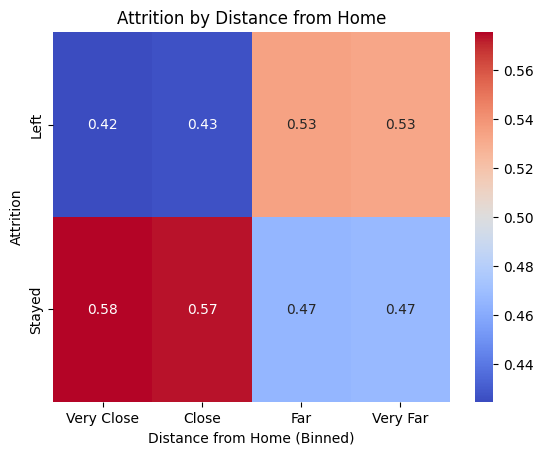

In [ ]:
'''Distance from Home vs. Attrition by Category'''

df['Distance Binned'] = pd.cut(df['Distance from Home'], bins=4, labels=['Very Close', 'Close', 'Far', 'Very Far'])
distance_attrition = df.groupby('Distance Binned')['Attrition'].value_counts(normalize=True).unstack().T
sns.heatmap(distance_attrition, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Attrition by Distance from Home')
plt.xlabel('Distance from Home (Binned)')
plt.ylabel('Attrition')
plt.show()

**Observations:** Employees that live closer to work are less likely to leave vs. those that live further from the office.

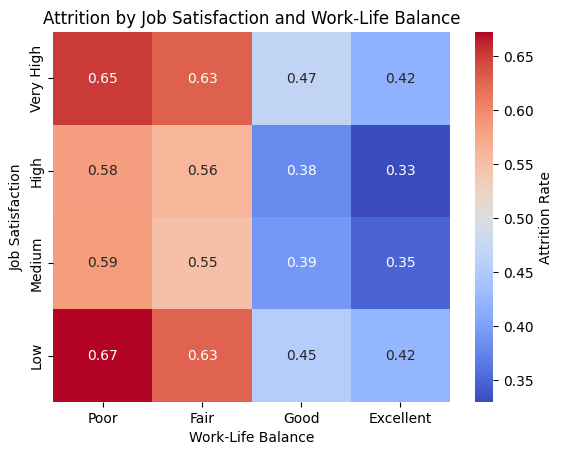

In [ ]:
''' Attrition by Job Satisfaction and Work-Life Balance '''

job_satisfaction_order = ['Very High', 'High', 'Medium', 'Low']
work_life_balance_order = ['Poor', 'Fair', 'Good', 'Excellent']

pivot_table = pd.pivot_table(
    df,
    values='Attrition',
    index='Job Satisfaction',
    columns='Work-Life Balance',
    aggfunc=lambda x: (x == 'Left').mean()
)

pivot_table = pivot_table.reindex(job_satisfaction_order).reindex(columns=work_life_balance_order)

# Heatmap using Seaborn
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt='.2f', cbar_kws={'label': 'Attrition Rate'})
plt.title('Attrition by Job Satisfaction and Work-Life Balance')
plt.xlabel('Work-Life Balance')
plt.ylabel('Job Satisfaction')
plt.show()

**Observations:** Employees with a low job satisfaction and poor work-life balance are most likely to leave; however, work-life balance has a much larger influence than job satisfaction since employees are more likely to stay if the work-life balance is good or excellent eventhough the job satisfaction is low or medium. This shows that people value work-life balance over job satisfaction.

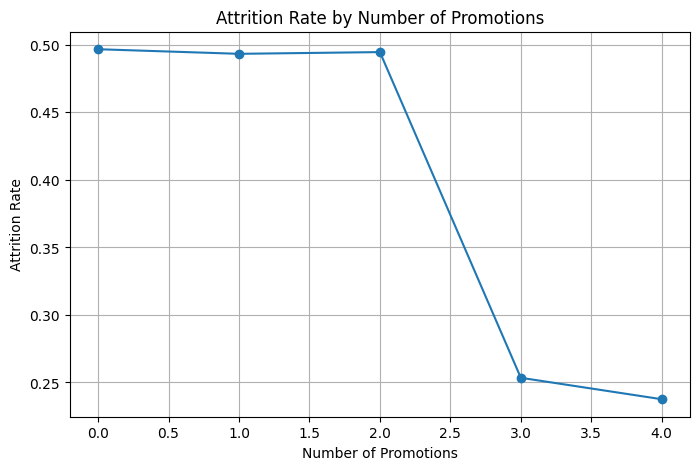

In [ ]:
''' Attrition by Number of Promotions '''

attrition_by_promotions = df.groupby('Number of Promotions')['Attrition'].value_counts(normalize=True).unstack()

# Line chart using matplotlib
attrition_by_promotions['Left'].plot(kind='line', marker='o', figsize=(8, 5))
plt.title('Attrition Rate by Number of Promotions')
plt.xlabel('Number of Promotions')
plt.ylabel('Attrition Rate')
plt.grid(True)
plt.show()

**Observations:** Employees with more than 2 promotions are significantly less likely to leave than employees with 2 or fewer promotions. This could indicate that companies should actively promote employees early on to retain top talent.

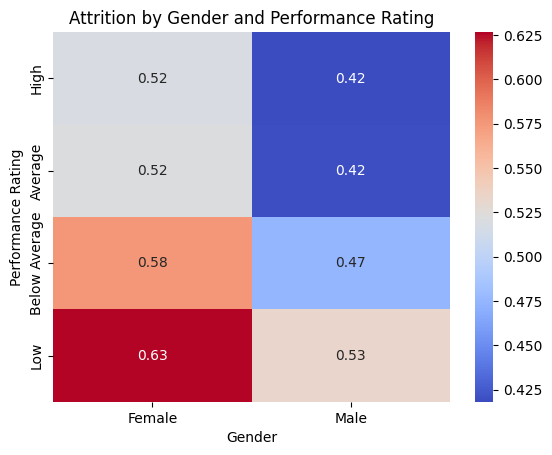

In [ ]:
''' Attrition by Gender and Performance Rating '''

attrition_by_gender_performance = df.groupby(['Gender', 'Performance Rating'])['Attrition'].value_counts(normalize=True).unstack()
order = ['High', 'Average', 'Below Average', 'Low']
attrition_by_gender_performance = attrition_by_gender_performance.reindex(order, level='Performance Rating')

# Heatmap using seaborn
pivot = attrition_by_gender_performance.loc[:, 'Left'].unstack(level=0)
sns.heatmap(pivot, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Attrition by Gender and Performance Rating')
plt.xlabel('Gender')
plt.ylabel('Performance Rating')
plt.show()

**Observations:** Overall females are more likely to leave regardless of performance rating, but both males and females with lower performance ratings have a higher attrition rate than those with higher performance ratings.

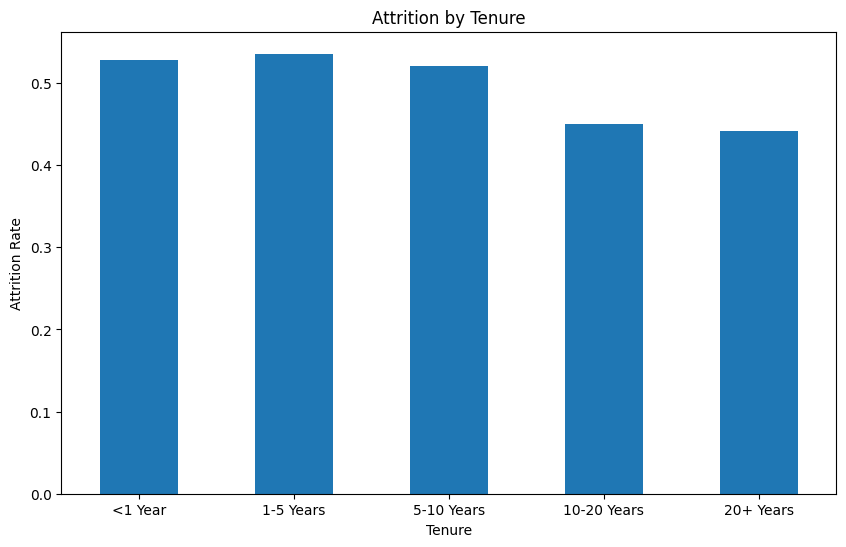

In [ ]:
''' Attrition by Tenure '''

# Bin Years at Company
df['Tenure Bins'] = pd.cut(df['Years at Company'], bins=[0, 1, 5, 10, 20, 50], labels=['<1 Year', '1-5 Years', '5-10 Years', '10-20 Years', '20+ Years'])

# Attrition by Tenure
attrition_by_tenure = df.groupby('Tenure Bins')['Attrition'].value_counts(normalize=True).unstack()

# Plot Attrition by Tenure
attrition_by_tenure['Left'].plot(kind='bar', figsize=(10, 6))
plt.title('Attrition by Tenure')
plt.xlabel('Tenure')
plt.ylabel('Attrition Rate')
plt.xticks(rotation=0)
plt.show()

**Observations:** Employees with more than 10 years of tenure at a company are less likely to leave than ones that only staed with the company less than 10 years.

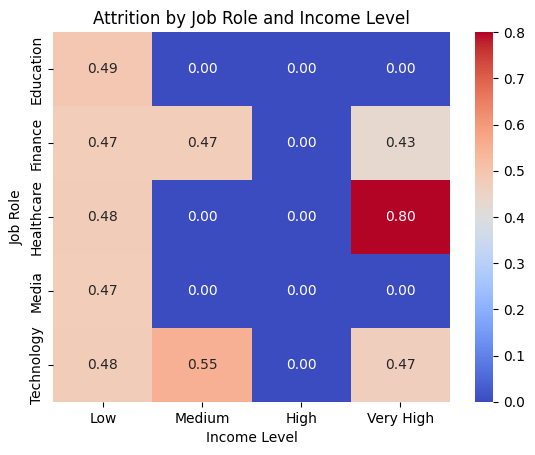

In [ ]:
''' Attrition by Job Role and Income Level '''

# Bin Income Levels
df['Income Level'] = pd.cut(df['Monthly Income'], bins=4, labels=['Low', 'Medium', 'High', 'Very High'])

# Attrition by Job Role and Income Level
attrition_by_role_income = df.groupby(['Job Role', 'Income Level'])['Attrition'].value_counts(normalize=True).unstack()

# Heatmap for Attrition by Job Role and Income Level
pivot = attrition_by_role_income['Left'].unstack(level=1)
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Attrition by Job Role and Income Level')
plt.xlabel('Income Level')
plt.ylabel('Job Role')
plt.show()

**Observations:** Employees with a low income level are more likely to leave no matter the job role except for Finance, Healthcare, and Technology. This can be due to the following reasons: Finance, Healthcare, and Technology generally have higher salaries than Education and Media, so there may not be many (or no) employees in the dataset for those job roles at higher salaries. Also, the similar attrition rates at higher income levels for Finance, Healthcare, and Technology could indicate that Income Level doesn't fully compensate for other factors leading to attrition. For example, Healthcare employees leaving at an 80% rate in the Very High Income Level category conflicts with idea that employees with higher income levels stay at a company.

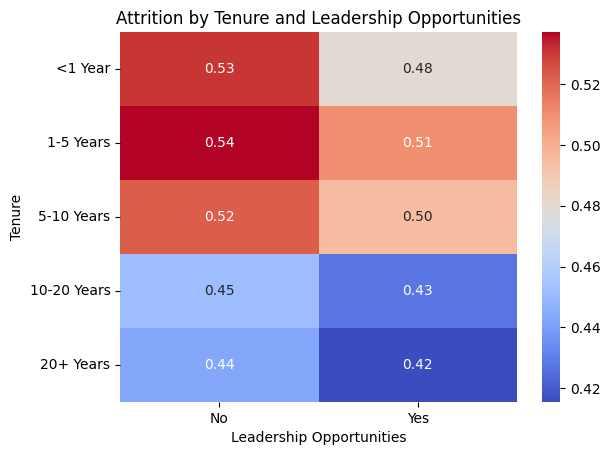

In [ ]:
''' Attrition by Tenure and Leadership Opportunities '''

# Bin Tenure into categories
df['Tenure Bins'] = pd.cut(df['Years at Company'], bins=[0, 1, 5, 10, 20, 50], labels=['<1 Year', '1-5 Years', '5-10 Years', '10-20 Years', '20+ Years'])

# Group by Tenure Bins and Leadership Opportunities
attrition_by_tenure_leadership = df.groupby(['Tenure Bins', 'Leadership Opportunities'])['Attrition'].value_counts(normalize=True).unstack()

# Create a heatmap
pivot_tenure_leadership = attrition_by_tenure_leadership['Left'].unstack()
sns.heatmap(pivot_tenure_leadership, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Attrition by Tenure and Leadership Opportunities')
plt.xlabel('Leadership Opportunities')
plt.ylabel('Tenure')
plt.show()

**Observations:** Overall tenure has a more significant influence (espeically after 10 years) on attrition than leadership opportunities, where those in the same tenure bucket are less likely to leave if given leaderhip opportunities.

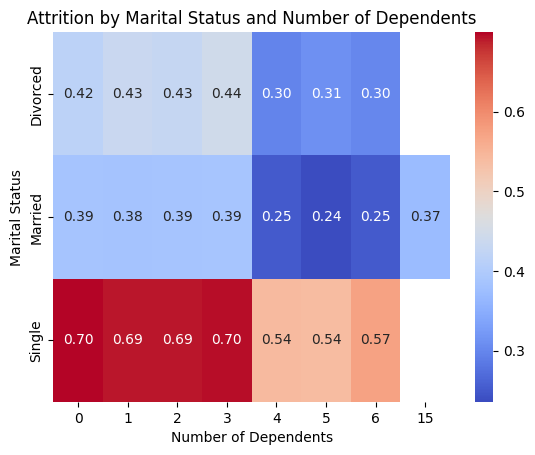

In [ ]:
''' Attrition by Marital Status and Number of Dependents '''

# Group by Marital Status and Number of Dependents
attrition_by_marital_dependents = df.groupby(['Marital Status', 'Number of Dependents'])['Attrition'].value_counts(normalize=True).unstack()

# Create a heatmap
pivot_marital_dependents = attrition_by_marital_dependents['Left'].unstack()
sns.heatmap(pivot_marital_dependents, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Attrition by Marital Status and Number of Dependents')
plt.xlabel('Number of Dependents')
plt.ylabel('Marital Status')
plt.show()

**Observations:** The larger the number of dependents, the lower the likelihood an employee will leave a company compared to others with the same marital status. However, single employees are more likely to leave than married/divorced employees no matter the number of dependents. This could be because single people are younger (on average) than married or divorced people, and from our results earlier, younger people tend to leave more than older people. It can also be because single people do not have to rely on another person.

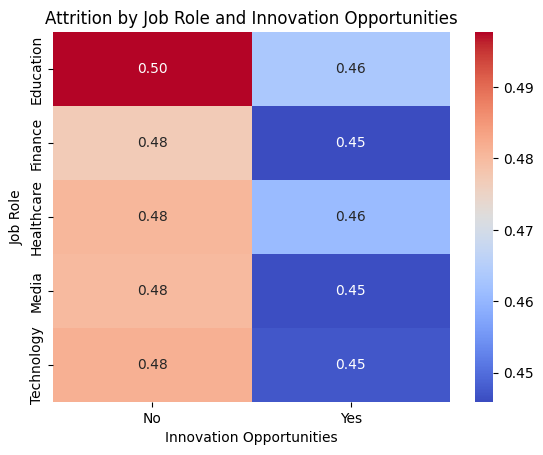

In [ ]:
''' Attrition by Job Role and Innovation Opportunities '''

# Group by Job Role and Innovation Opportunities
attrition_by_job_innovation = df.groupby(['Job Role', 'Innovation Opportunities'])['Attrition'].value_counts(normalize=True).unstack()

# Heatmap for Attrition by Job Role and Innovation Opportunities
pivot = attrition_by_job_innovation['Left'].unstack(level=1)
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Attrition by Job Role and Innovation Opportunities')
plt.xlabel('Innovation Opportunities')
plt.ylabel('Job Role')
plt.show()

**Observations:** Despite the job role, if there are innovation opportunites available, the attrition rate is lower by a marginal amount.

---
## **Observations and Suggestions**
- Focus on retaining employees in junior roles by providing **clear promotion pathways** and **career development opportunities**.
- Offer **flexible work options** like remote or hybrid work to improve retention, especially for employees seeking better work-life balance.
- Address factors like **excessive overtime** to reduce burnout and dissatisfaction.
- Ensure **pay scales are competitive** and reflective of job responsibilities to boost satisfaction in lower-income roles.
- Invest in programs that **enhance work-life balance**, such as wellness initiatives or flexible scheduling, to foster loyalty.
- Maintain or **improve company reputation** to attract and retain talent.

### Next Steps:
- Explore employee sentiment through reviews to identify hidden drivers of dissatisfaction or loyalty.

# **Part 3: Employee Review Extraction**

In this section, we scrape employee reviews from [CareerBliss](https://www.careerbliss.com/) to gain additional insights into the factors influencing attrition. Based on our research, we identified 8 companies with [low turnover rates](https://www.visualcapitalist.com/cp/top-companies-for-employee-retention-in-the-u-s-and-uk/#google_vignette ) and 8 with [high turnover rates](https://www.visualcapitalist.com/cp/ranked-worst-companies-for-employee-retention-u-s-and-uk/#google_vignette). Our goal is to explore how employee review sentiment might correlate with turnover, by analyzing reviews from these companies.

Based on our research, we have scraped employee reviews from mulitple high/low attrition companies.

- High Attrition Companies:
  - Apple
  - Amazon
  - Facebook
  - Tesla
  - AMD
  - ServiceNow
  - Mastercard
  - Abbot Laboratories

- Low Attrition Companies
  - Conoco Phillips
  - Chevron
  - Lockheed Martin
  - Comcast
  - Boeing
  - ExxonMobil
  - Progressive
  - Honeywell

**Note**: The dataframe generated from the scraping is found in an auxillary notebook. Additionaly, the results of the sentiment analysis will NOT be used in the modeling section (Part 4). This part serves as a deeper exploratory data analysis to enrich our understanding of employee sentiment in relation to turnover.

### Approach:
1. Review Scraping: We scrape reviews from the identified companies.
2. Sentiment Analysis: Using three different NLP models—Vader, TextBlob, and Flair—we perform sentiment analysis on the reviews.
3. Data Visualization: The sentiment results are plotted to visualize the ratio of negative reviews to positive reviews for each company.

### Objective:
The objective is to determine whether companies with higher attrition rates receive more negative feedback compared to those with lower attrition rates. This will provide a deeper understanding of the employee experience in relation to turnover.


In [ ]:
!pip install flair --quiet
!pip install nltk --quiet
!pip install textblob --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 16.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 776.5/776.5 kB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.6/202.6 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 59.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/83.2 kB 4.9 MB/s eta 0:00:00


In [ ]:
# Imports for NLP
from nltk.sentiment import SentimentIntensityAnalyzer
import nltk
from textblob import TextBlob
from flair.data import Sentence
from flair.nn import Classifier

## **3.1 Data Wrangling and Cleaning**

In [ ]:
# Read the reviews_df from the generated CSV saved in Github
review_csv_url = "https://raw.githubusercontent.com/mdemasi2218/Employee-Attrition-Analysis/refs/heads/master/careerbliss_reviews.csv"
reviews_df = pd.read_csv(review_csv_url)

In [ ]:
# View the dataframe
reviews_df.head()

,review_id,company_name,job_title,company_id,job_title_id,review,attrition_level
0,2092114,Apple,Apple Employee,291,1,"""Working as an Apple Specialist is a great job...",high
1,2088195,Apple,Apple Employee,291,1,"""Great job and a cool company to work for with...",high
2,2087555,Apple,Apple Employee,291,1,"""Good work environment. I have worked in a jun...",high
3,2087102,Apple,Operations Specialist,291,14662,"""I've worked for Apple for over 3 years now. T...",high
4,2076713,Apple,Apple Employee,291,1,"""Big company and innovative.\nGood employee be...",high


In [ ]:
reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4911 entries, 0 to 4910
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   review_id        4911 non-null   int64 
 1   company_name     4911 non-null   object
 2   job_title        4911 non-null   object
 3   company_id       4911 non-null   int64 
 4   job_title_id     4911 non-null   int64 
 5   review           4911 non-null   object
 6   attrition_level  4911 non-null   object
dtypes: int64(3), object(4)
memory usage: 268.7+ KB


In [ ]:
# Check for nulls
na_rows_count = reviews_df.isnull().any(axis=1).sum()
print(f"Number of rows with NaN values: {na_rows_count}\n")

# Drop nulls
reviews_df = reviews_df.dropna().reset_index(drop=True)
reviews_df.info()

Number of rows with NaN values: 0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4911 entries, 0 to 4910
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   review_id        4911 non-null   int64 
 1   company_name     4911 non-null   object
 2   job_title        4911 non-null   object
 3   company_id       4911 non-null   int64 
 4   job_title_id     4911 non-null   int64 
 5   review           4911 non-null   object
 6   attrition_level  4911 non-null   object
dtypes: int64(3), object(4)
memory usage: 268.7+ KB


In [ ]:
# Check for duplicate rows
duplicate_count = reviews_df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_count}\n")

# Remove duplicate rows
reviews_df = reviews_df.drop_duplicates()
reviews_df = reviews_df.reset_index(drop=True)
reviews_df.info()

Number of duplicate rows: 15

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4896 entries, 0 to 4895
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   review_id        4896 non-null   int64 
 1   company_name     4896 non-null   object
 2   job_title        4896 non-null   object
 3   company_id       4896 non-null   int64 
 4   job_title_id     4896 non-null   int64 
 5   review           4896 non-null   object
 6   attrition_level  4896 non-null   object
dtypes: int64(3), object(4)
memory usage: 267.9+ KB


In [ ]:
# Get number of unique values for each column in the dataset
for column in reviews_df.columns:
    unique_count = reviews_df[column].nunique()

    # Print unique items as a list if there are fewer than 10
    if unique_count < 21:
        unique_items = reviews_df[column].unique().tolist()
        if isinstance(unique_items[0], int): unique_items = sorted(unique_items)
        print(f"{column}: {unique_count} unique values: {unique_items}")
    else:
      print(f"{column}: {unique_count} unique values")

review_id: 4896 unique values
company_name: 16 unique values: ['Apple', 'Amazon', 'Facebook', 'Tesla Motors', 'Advanced Micro Devices', 'ServiceNow', 'MasterCard', 'Abbott Laboratories', 'ConocoPhillips', 'Chevron', 'Lockheed Martin', 'Comcast', 'Boeing', 'ExxonMobil', 'Progressive', 'Honeywell']
job_title: 1704 unique values
company_id: 16 unique values: [5, 12, 25, 33, 40, 175, 283, 291, 495, 699, 764, 1454, 1755, 2628, 11962, 26543]
job_title_id: 1689 unique values
review: 4708 unique values
attrition_level: 2 unique values: ['high', 'low']


## **3.2 Sentiment Analysis (NLP)**

Now we will determine the sentiment of each review using different NLP techniques.

### 3.2.1 Helper Functions

The functions below will be used to evaluate the sentiment analysis.,

In [ ]:
''' Function to display sample reviews for each sentiment category '''

def print_sample_reviews(df):
    for category in sorted(df['review_score_category'].unique()):
        print(f"\nSentiment Category: {category}")
        # Filter reviews with the current category
        sample_reviews = df[df['review_score_category'] == category].head(3)
        for i, row in sample_reviews.iterrows():
            print(f"{i + 1}. {row['review']} ({row['review_score']:.2f})\n")

In [ ]:
''' Function to generate a bar plot showing the distribution of sentiment categories in the given dataframe. '''

def plot_sentiment_distribution(df):
    # Count the occurrences of each sentiment category
    category_counts = df['review_score_category'].value_counts().reset_index()
    category_counts.columns = ['Sentiment Category', 'Count']

    # Create the bar plot
    fig = px.bar(
        category_counts,
        x='Sentiment Category',
        y='Count',
        title='Distribution of Sentiment Categories',
        labels={'Sentiment Category': 'Sentiment Category', 'Count': 'Count'},
        color='Sentiment Category',
        color_continuous_scale='Viridis'
    )

    fig.update_layout(title_x=0.5)
    fig.show()

In [ ]:
''' Function to assign sentiment categories based on the score for VADER and TextBlob '''

def assign_review_score_category(score):
    if score < 0:
        return "Negative"
    elif score >= 0 and score < 0.2:
        return "Neutral"
    else:
        return "Positive"

### 3.2.2 Sentiment Analysis with VADER

VADER is a rule-based sentiment analysis tool that evaluates text polarity using a lexicon of words. It assigns a compound score ranging from -1  to +1, making it ideal for analyzing reviews or social media posts.

This code below uses VADER to score employee reviews and categorize them as "Negative," "Neutral," or "Positive".


In [ ]:
vader_df = reviews_df.copy()

nltk.download('vader_lexicon')

# Initialize the Sentiment Intensity Analyzer
sia = SentimentIntensityAnalyzer()

# Create new columns "review_score" and "review_score_category" using VADER
vader_df['review_score'] = vader_df['review'].apply(lambda review: sia.polarity_scores(review)['compound'])
vader_df['review_score_category'] = vader_df['review_score'].apply(assign_review_score_category)

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


In [ ]:
# Show some review results from the VADER dataframe
print_sample_reviews(vader_df)


Sentiment Category: Negative
27. "Not great for career growth." (-0.51)

129. "No Comment for this selection." (-0.30)

195. "I don't like how this system is making me write a review I don't want to write. I am here to apply for a job not to write a review." (-0.33)


Sentiment Category: Neutral
29. "Phenomenal place to work while attending college" (0.00)

47. "I have worked for Apple for about 8 month as a contractor. It is a competitive company." (0.18)

48. "About my current employer." (0.00)


Sentiment Category: Positive
1. "Working as an Apple Specialist is a great job. The pay is good, the benefits are great, and the work is interesting and challenging. Additionally, there is a lot of room for advancement within the company. However, the hours can be long, and the work can be stressful at times." (0.92)

2. "Great job and a cool company to work for with many perks and benefits. The only con is that it’s a very large company so culture changes with the department and you can ea

In [ ]:
# Plot the distributions of sentiment categories from the VADER results
plot_sentiment_distribution(vader_df)

---
**VADER Observations**

The sentiment distribution plot shows there are significantly more positive reviews than neutral or negative reviews. This could be true, or it can also be that VADER tends to rate more positively than neutral or negatively.

- **Negative Sentiment**: VADER successfully captures reviews with explicitly negative tones, such as "Not great for career growth" (-0.51). However, some reviews with ambiguous language such as "No Comment for this selection" (-0.30) could arguably be classified as neutral.
  
- **Neutral Sentiment**: VADER categorizes reviews with mixed or non-committal language as neutral. Here we can see the review "Phenomenal place to work while attending college" (0.00) seems to be mislabeled, as the term "phenomenal" conveys a positive sentiment. This indicates VADER may struggle with certain contexts.

- **Positive Sentiment**: Reviews expressing clear positivity, such as "Working as an Apple Specialist is a great job..." (0.92), are correctly classified. However, lengthy reviews with balanced pros and cons might skew towards positive scores, as seen in "Great job and a cool company to work for..." (0.89), despite mentioning drawbacks.


### 3.2.3 Sentiment Analysis with TextBlob

TextBlob evaluates text polarity on a scale from -1 to +1.

The code below uses TextBlob to analyze employee reviews, assigning a polarity score and categorizing the sentiment as "Negative," "Neutral," or "Positive."


In [ ]:
textBlob_df = reviews_df.copy()

# Create new columns "review_score" and "review_score_category" using TextBlob
textBlob_df['review_score'] = textBlob_df['review'].apply(lambda review: TextBlob(review).sentiment.polarity)
textBlob_df['review_score_category'] = textBlob_df['review_score'].apply(assign_review_score_category)

In [ ]:
# Call the print_sample_reviews function with the textBlob DataFrame
print_sample_reviews(textBlob_df)


Sentiment Category: Negative
27. "Not great for career growth." (-0.40)

126. "For an entry-level job out of college they pay well, but the job content is menial and they treat their contractors poorly. There is no room to move up or grow unless you get hired on full time by the client, which only happened once in over a year of working there." (-0.02)

137. "At Apple it has given me the opportunity to expand my knowledge in the technology, and also gave me the chance to utilize my problem solving skills everyday." (-0.20)


Sentiment Category: Neutral
4. "I've worked for Apple for over 3 years now. They are an excellent company to work for as their benefits and workstyle is top-notch in the business. The only drawback is the jump between retail and corporate is near impossible without the long commitment." (0.20)

16. "I was welcomed by the entire team since the beginning. The first couple of months were meant for me to adapt to the team, the processes, the goals, and the mentality. 

In [ ]:
# Plot the distributions of sentiment categories from the textBlob results
plot_sentiment_distribution(textBlob_df)

---
**TextBlob Observations**

The sentiment distribution plot shows there are still significantly more positive reviews than neutral or negative reviews, but there are more neutral reviews (and less negative reviews) than using VADER.

- **Negative Sentiment**: TextBlob captures some negative reviews accurately, such as "Not great for career growth" (-0.40). However, reviews like "At Apple it has given me the opportunity..." (-0.20) might be misclassified due to the presence of mixed or mildly negative language.

- **Neutral Sentiment**: TextBlob tends to classify detailed reviews with mixed sentiments as neutral. Despite containing both positive and critical elements, the overall tone leans positive, suggesting a potential misclassification.

- **Positive Sentiment**: Reviews with strong positive language, such as "Working as an Apple Specialist is a great job..." (0.54), are correctly identified. It tends to sway towards a positive sentiment for mixed sentences, but performs better than VADER.

These results suggest that while TextBlob outperforms VADER in this case, a more advanced model might be necessary to better identify complex or mixed sentiments.


### 3.2.4 Sentiment Analysis with Flair

Flair is a powerful NLP library that leverages pre-trained models built on deep learning. It assigns a sentiment label of either "Positive" or "Negative" to the text along with a confidence score that indicates the model's certainty in its prediction.

Flair is particularly effective in capturing subtle sentiment nuances, making it ideal for analyzing reviews. For optimal performance, it is recommended to use **GPU**.

The following code uses Flair to analyze employee reviews, assign sentiment labels, and provide a confidence score for each review.


In [ ]:
flair_df = reviews_df.copy()

# load the pre-trained sentiment analysis model from Flair
classifier = Classifier.load('sentiment')

# Define a function to calculate the sentiment score using Flair
def assign_review_score(review):
    sentence = Sentence(review)
    classifier.predict(sentence)
    if sentence.labels[0].value == "POSITIVE":
        return sentence.labels[0].score
    else:
        return -sentence.labels[0].score

flair_df['review_score'] = flair_df['review'].apply(assign_review_score)
flair_df['review_score_category'] = flair_df['review_score'].apply(lambda x: 'Positive' if x > 0 else 'Negative')

2024-12-05 19:34:06,767 https://nlp.informatik.hu-berlin.de/resources/models/sentiment-curated-distilbert/sentiment-en-mix-distillbert_4.pt not found in cache, downloading to /tmp/tmpartxli3y


100%|██████████| 253M/253M [00:25<00:00, 10.5MB/s]

2024-12-05 19:34:32,762 copying /tmp/tmpartxli3y to cache at /root/.flair/models/sentiment-en-mix-distillbert_4.pt


2024-12-05 19:34:34,452 removing temp file /tmp/tmpartxli3y


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [ ]:
''' Print sample reviews from the Flair dataframe '''

# Rows to categorize to compare with VADER/TextBlob results
rows = [0, 1, 2, 26, 128, 201, 204, 28, 47, 68, 81]

filtered_df = flair_df.loc[rows]
for category in sorted(filtered_df['review_score_category'].unique()):
    print(f"\nSentiment Category: {category}")
    sample_reviews = filtered_df[filtered_df['review_score_category'] == category]
    for i, row in sample_reviews.iterrows():
        print(f"{i + 1}. {row['review']} ({row['review_score']:.2f})\n")


Sentiment Category: Negative
27. "Not great for career growth." (-1.00)

129. "No Comment for this selection." (-0.74)


Sentiment Category: Positive
1. "Working as an Apple Specialist is a great job. The pay is good, the benefits are great, and the work is interesting and challenging. Additionally, there is a lot of room for advancement within the company. However, the hours can be long, and the work can be stressful at times." (0.82)

2. "Great job and a cool company to work for with many perks and benefits. The only con is that it’s a very large company so culture changes with the department and you can easily fade and become another fly on the wall." (0.99)

3. "Good work environment. I have worked in a junior position but learned a lot. Thanks to my team." (0.99)

202. "I started in 2017 and learned a lot about conflict management and customer retention." (0.62)

205. "Apple needs no introduction." (0.58)

29. "Phenomenal place to work while attending college" (1.00)

48. "About 

In [ ]:
# Filter reviews with lesser uncertainties
flair_df = flair_df[((flair_df['review_score'] >= -1.0) & (flair_df['review_score'] < -0.8)) | ((flair_df['review_score'] >= 0.9) & (flair_df['review_score'] <= 1.0))]

In [ ]:
# Plot the distributions of sentiment categories from the Flair results
plot_sentiment_distribution(flair_df)

---
**Flair Observations**

- **Negative Sentiment**: Flair accurately classifies clearly negative reviews such as "Not great for career growth" (-1.00). However, the negative score for reviews with less certainty, like "No Comment for this selection," (-0.74) might be misleading.
- A negative sentiment can be filtered by requiring a confidence score lower than -0.8. This helps eliminate cases where the model is less certain about the negativity of a review.

- **Positive Sentiment**: Flair performs well with positive reviews, such as "Working as an Apple Specialist is a great job..." (0.82) and "Great job and a cool company to work for..." (0.99). While these are correctly classified, the confidence score for reviews like "Apple needs no introduction" (0.58) might be too low to be considered definitively positive without additional filtering.
- A positive sentiment can be filtered by requiring a confidence score greater than 0.9. This ensures that only the most confident positive predictions are considered valid, reducing the likelihood of misclassification.

By applying these thresholds, the results can be improved, ensuring that only reviews with a strong and confident sentiment assignment are included, and reducing the impact of ambiguous or borderline cases. Since this model performs better than the VADER and TextBlob, we will use it moving forward.


## **3.3 Sentiment EDA**

In [ ]:
''' Create a dataframe from the flair dataframe that counts the number of positive and negative reviews for each company '''

query = """
SELECT
    company_id,
    company_name,
    attrition_level,
    SUM(CASE WHEN review_score_category = 'Positive' THEN 1 ELSE 0 END) AS positive_reviews,
    SUM(CASE WHEN review_score_category = 'Negative' THEN 1 ELSE 0 END) AS negative_reviews
FROM
    flair_df
GROUP BY
    company_id, company_name, attrition_level
"""

review_counts_df = ps.sqldf(query, locals())

In [ ]:
# Create a new column to calculate the negative to positive ratio, higher value means more negative review percentage
review_counts_df['negative_to_positive_ratio'] = review_counts_df['negative_reviews'] / review_counts_df['positive_reviews']
review_counts_df = review_counts_df.sort_values(by='negative_to_positive_ratio', ascending=False).reset_index(drop=True)
review_counts_df

,company_id,company_name,attrition_level,positive_reviews,negative_reviews,negative_to_positive_ratio
0,283,Amazon,high,402,183,0.455224
1,25,Comcast,low,419,163,0.389021
2,5,Lockheed Martin,low,553,215,0.388788
3,1755,Progressive,low,29,10,0.344828
4,495,Chevron,low,142,46,0.323944
5,175,Advanced Micro Devices,high,102,33,0.323529
6,12,Honeywell,low,248,79,0.318548
7,40,Boeing,low,424,134,0.316038
8,699,ExxonMobil,low,93,26,0.279570
9,1454,ConocoPhillips,low,45,12,0.266667


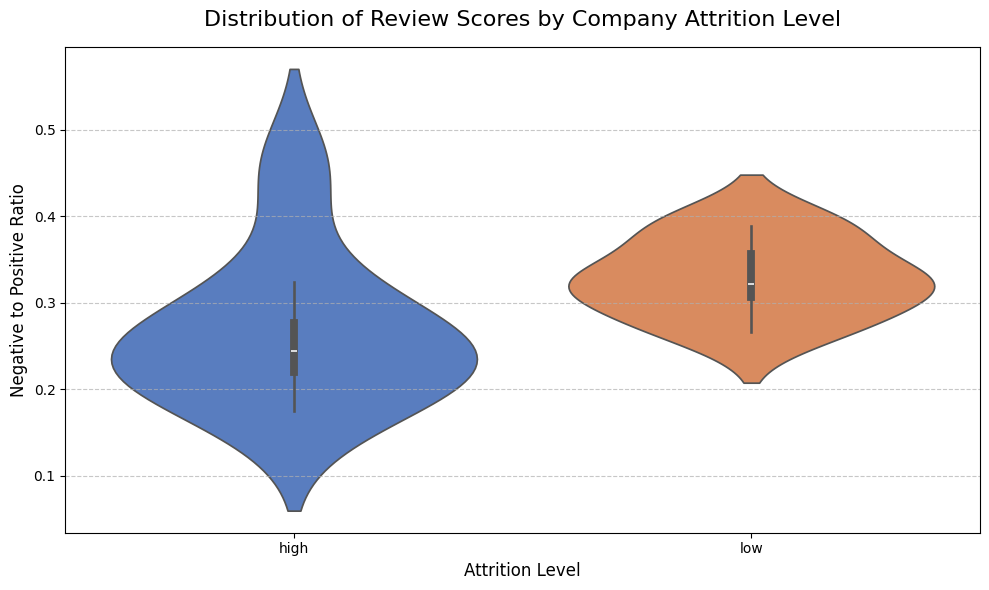

In [ ]:
''' Plot the Distribution of Review Scores by Attrition Level '''

# Create the violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(
    data=review_counts_df,
    x='attrition_level',
    y='negative_to_positive_ratio',
    inner='box',
    palette='muted'
)

plt.title('Distribution of Review Scores by Company Attrition Level', fontsize=16, pad=15)
plt.xlabel('Attrition Level', fontsize=12)
plt.ylabel('Negative to Positive Ratio', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
''' Compare the average negative to positive review ratio by company attrition level '''

# Calculate the average negative_to_positive_ratio for each attrition level
average_ratios = review_counts_df.groupby('attrition_level')['negative_to_positive_ratio'].mean().round(3).reset_index()
average_ratios

,attrition_level,negative_to_positive_ratio
0,high,0.267
1,low,0.328


---
## **Observations**

Low Attrition Companies companies tend to have a higher proportion of negative reviews (0.328 vs. 0.267). This could imply that employees stay with the company despite some dissatisfaction or frustration. They may have less opportunity to leave, or they may feel invested in their roles over the long term, leading to frustration manifesting in negative reviews.

High Attrition Companies tend to have a lower negative-to-positive ratio, which could indicate that employees who leave may not express strong dissatisfaction. This suggests that employees might exit without leaving overly negative reviews, or that remaining employees tend to give more positive reviews.

### Possible Explanations for the Results:
  - Employees at a low attrition company may stay for reasons unrelated to satisfaction (e.g., limited external opportunities or long tenure), which could lead to more critical reviews despite staying in the company.
  - Employees at a high attrition company may exit early due to dissatisfaction, competition, or numerous other external opportunites without leaving highly negative feedback.
  - Larger companies, particularly in the tech industry (e.g., AMD, Apple), tend to have a larger volume of reviews, with more positive reviews outweighing any negativity. These companies might have a higher volume of positive feedback due to their number of benefits and company reputation.
  - Smaller companies or manufacturing firms might have fewer reviews less of a company reputation, possibly leading to more critical perspectives.
  - Companies with higher attrition might experience more positive feedback from remaining employees, making the negative-to-positive ratio seem more favorable.


# **Part 4: Modeling with Machine Learning**

In this section, we will explore various machine learning models to predict employee attrition, starting with simpler models and progressing to more advanced techniques. The goal is to understand how different algorithms perform on this dataset, analyze their strengths and weaknesses, and evaluate their predictions using appropriate metrics.

The models we will implement include:

1. Baseline Models: Logistic regression and it's regularized couterparts (Ridge, Lasso, Elastic Net)

2. Tree-Based Models: Decision Trees, Random Forests, XGBoost

3. Advanced/Non-linear Models: Neural Networks (Basic and Advanced)

Each model will be evaluated using the appropriate metrics including accuracy, precision, recall, and F1-score. This progression will highlight how predictive performance changes with different and more complex models.


In [ ]:
# Imports for Modeling
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, RandomizedSearchCV
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tabulate import tabulate

# Regression
from sklearn.linear_model import LogisticRegression, Ridge,Lasso, ElasticNet

# Decision Trees
from sklearn.tree import DecisionTreeClassifier

# Random Forests
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import randint

# XGBoost
import xgboost as xgb

# Neural Nets
import torch
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import torch.nn as nn

## **4.1 Preprocessing and Feature Engineering**

Before modeling, we need to label and one-hot encode categorical features.

**Note:** This is different than the feature encoding from Part 2 since we will be creating new columns for each categorical feature that isn't binary or has a rank (like low, medium, high) for model creation.

In [ ]:
''' Use label and one-hot encode features for model creation '''

encoded_df = original_df.drop(columns=['Employee ID']).copy()

# One-hot encode the specified columns
encoded_df = pd.get_dummies(encoded_df, columns=['Job Role', 'Education Level', 'Marital Status', 'Job Level', 'Company Size'], dtype='int64')

# Map binary columns to 0 and 1
binary_cols = ['Overtime', 'Remote Work', 'Leadership Opportunities', 'Innovation Opportunities']
encoded_df[binary_cols] = encoded_df[binary_cols].apply(lambda col: col.str.lower().map({'yes': 1, 'no': 0}))

# Manually ordered mappings for label encoding
manual_order = {
    'Company Reputation': ['Poor', 'Fair', 'Good', 'Excellent'],
    'Employee Recognition': ['Low', 'Medium', 'High', 'Very High'],
    'Work-Life Balance': ['Poor', 'Fair', 'Good', 'Excellent'],
    'Job Satisfaction': ['Low', 'Medium', 'High', 'Very High'],
    'Performance Rating': ['Low', 'Below Average', 'Average', 'High'],
    'Gender': ['Female', 'Male'],
    'Attrition': ['Stayed', 'Left']
}

# Label encode identified object columns
category_mappings = {}
for col in manual_order:
    encoded_df[col] = pd.Categorical(encoded_df[col], categories=manual_order[col], ordered=True).codes
    category_mappings[col] = dict(enumerate(manual_order[col]))

for col, mapping in category_mappings.items():
    print(f"Column '{col}': {mapping}")

# Move the Attrition column to end
attrition_column = encoded_df.pop('Attrition')
encoded_df['Attrition'] = attrition_column

# Display the processed dataframe
encoded_df.info()

Column 'Company Reputation': {0: 'Poor', 1: 'Fair', 2: 'Good', 3: 'Excellent'}
Column 'Employee Recognition': {0: 'Low', 1: 'Medium', 2: 'High', 3: 'Very High'}
Column 'Work-Life Balance': {0: 'Poor', 1: 'Fair', 2: 'Good', 3: 'Excellent'}
Column 'Job Satisfaction': {0: 'Low', 1: 'Medium', 2: 'High', 3: 'Very High'}
Column 'Performance Rating': {0: 'Low', 1: 'Below Average', 2: 'Average', 3: 'High'}
Column 'Gender': {0: 'Female', 1: 'Male'}
Column 'Attrition': {0: 'Stayed', 1: 'Left'}
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70558 entries, 0 to 70557
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Age                          70558 non-null  int64  
 1   Gender                       70558 non-null  int8   
 2   Years at Company             70558 non-null  int64  
 3   Monthly Income               70558 non-null  int64  
 4   Work-Life Balance            70558 non-null  int8

In [ ]:
# Convert Distance from Home and Company Tenure to int
encoded_df['Distance from Home'] = encoded_df['Distance from Home'].astype(int)
encoded_df['Company Tenure'] = encoded_df['Company Tenure'].astype(int)
encoded_df.head()

,Age,Gender,Years at Company,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,Overtime,Distance from Home,...,Marital Status_Divorced,Marital Status_Married,Marital Status_Single,Job Level_Entry,Job Level_Mid,Job Level_Senior,Company Size_Large,Company Size_Medium,Company Size_Small,Attrition
0,31,1,19,5390,3,1,2,2,0,22,...,0,1,0,0,1,0,0,1,0,0
1,59,0,4,5534,0,2,0,3,0,21,...,1,0,0,0,1,0,0,1,0,0
2,24,0,10,8159,2,2,0,0,0,11,...,0,1,0,0,1,0,0,1,0,0
3,36,0,7,3989,2,2,3,1,0,27,...,0,0,1,0,1,0,0,0,1,0
4,56,1,41,4821,1,3,2,0,1,71,...,1,0,0,0,0,1,0,1,0,0


In [ ]:
# stores features dataframe into variable called "features"
features = encoded_df.drop(columns=['Attrition'])

# store the classification target variable into "target"
target = encoded_df['Attrition']

# Conduct 80/20 train-test split with random_state = 42
seed = 42
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=seed)

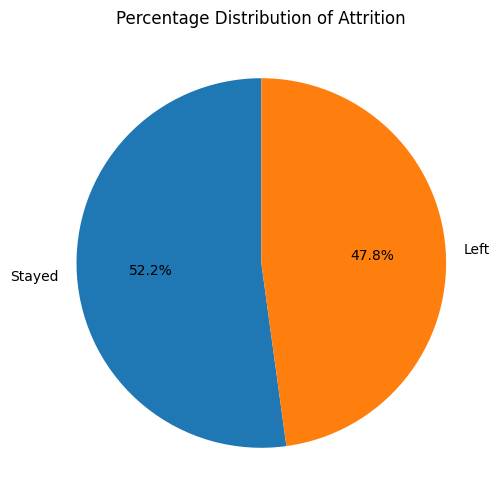

In [ ]:
# Calculate and plot the distribution of attrition
dist = y_train.value_counts(normalize=True)*100
plt.figure(figsize=(8, 6))
plt.pie(dist, labels=['Stayed', 'Left'], autopct='%1.1f%%', startangle=90)
plt.title('Percentage Distribution of Attrition')
plt.show()

**Observations:** The distribution is prettty balanced, so we do not have to perform oversampling or undersampling.

## **4.2 Principal Component Analysis (PCA)**

Based on the correlation matrix we created in Section 2.3, we know that there are some variables that are linearly correlated. Thus, we can safely apply PCA to reduce the dimensionality of our data.

In [ ]:
# PCA is not scale-invariant, so need to standardize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Instantiate and Fit PCA
pca = PCA()
pca_result = pca.fit(X_train_scaled)

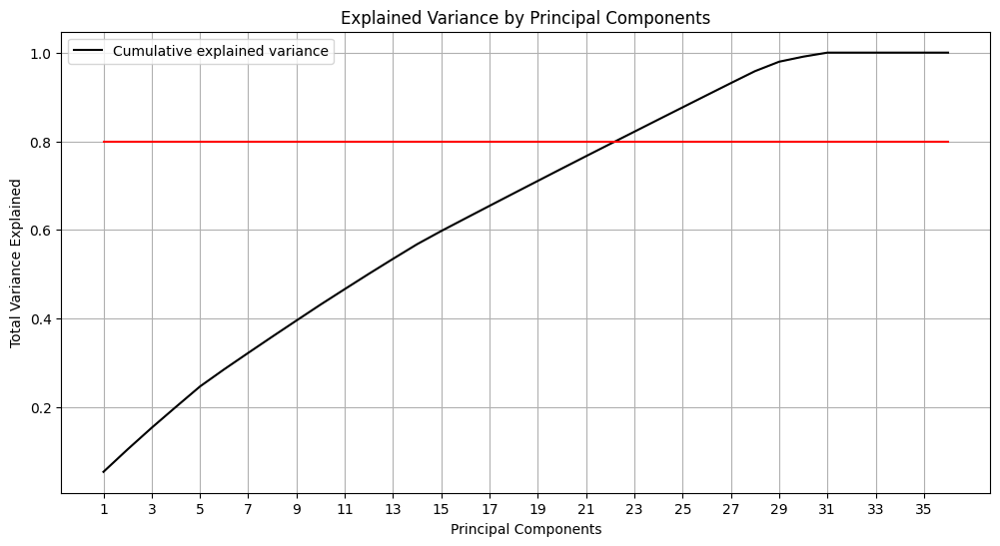

We need 23 principal components


In [ ]:
explained_variance = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance)

# Plot the cumulative explained variance to identify how many components we should use for PCA
threshold = 0.80
x_ticks = np.arange(len(cumulative_explained_variance)) + 1

plt.figure(figsize=(12, 6))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, color='k', label='Cumulative explained variance')
sns.lineplot(x = x_ticks, y = threshold * np.ones(len(cumulative_explained_variance)), color='r')
plt.xlabel('Principal Components')
plt.ylabel('Total Variance Explained')
plt.title('Explained Variance by Principal Components')
plt.xticks(range(1, len(explained_variance) + 1, 2))
plt.legend()
plt.grid(True)
plt.show()

print("We need " + str(np.argmax(cumulative_explained_variance >= threshold) + 1) + " principal components")

Based on this PCA analysis, we can see that once we have 23 principal components, we have explained over 80% of the variance. The red line intersects the cumulative explained variance just past 22 principal components.

In [ ]:
n = 23
pca = PCA(n_components=n)

# transform data using PCA
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

## **4.3 Helper Functions**


In [ ]:
''' Function to generate results for model metrics '''

def generate_results(y_pred, y_pred_prob):
    # Find the accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Test Accuracy: {accuracy:.2%}")

    # ROC-AUC Score
    roc_auc = roc_auc_score(y_test, y_pred_prob)
    print(f"ROC-AUC Score: {roc_auc:.2%}")

    # Compute the confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Calculate Precision, Recall, and F1-Score
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    print(f"Precision: {precision:.2%}")
    print(f"Recall: {recall:.2%}")
    print(f"F1-Score: {f1:.2%}")

    # Plot confusion matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(
        pd.DataFrame(conf_matrix),
        annot=True,
        fmt='.0f',
        cmap='Blues',
        xticklabels=['Stayed', 'Left'],
        yticklabels=['Stayed', 'Left']
    )
    plt.title("Confusion Matrix Heatmap")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Plot ROC Curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()

In [ ]:
''' Function to generate results for Spark model metrics '''

def generate_results_spark(predictions):
    app_columns = predictions.select("prediction", "Attrition")
    app_columns_rdd = app_columns.rdd.map(lambda row: (float(row['prediction']), float(row['Attrition'])))
    metrics = MulticlassMetrics(app_columns_rdd)
    confusion_matrix = metrics.confusionMatrix().toArray()

    # Calculate metrics
    tp = confusion_matrix[1, 1]
    tn = confusion_matrix[0, 0]
    fp = confusion_matrix[0, 1]
    fn = confusion_matrix[1, 0]
    total_sum = np.sum(confusion_matrix)

    # Accuracy
    test_accuracy = (tp + tn) / total_sum

    # Precision, Recall, F1-Score
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0.0

    # Print metrics
    print(f"Test Accuracy: {test_accuracy:.2%}")
    print(f"Precision: {precision:.2%}")
    print(f"Recall: {recall:.2%}")
    print(f"F1-Score: {f1_score:.2%}")

    # Calculate ROC-AUC score
    y_pred_prob = predictions.select("probability").rdd.map(lambda x: float(x[0][1])).collect()
    y_test = predictions.select("Attrition").rdd.map(lambda x: float(x[0])).collect()
    roc_auc = roc_auc_score(y_test, y_pred_prob)
    print(f"ROC-AUC Score: {roc_auc:.2%}")

    # Plot confusion matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(
        confusion_matrix,
        annot=True,
        fmt='.0f',
        cmap='Blues',
        xticklabels=['Stayed', 'Left'],
        yticklabels=['Stayed', 'Left']
    )
    plt.title("Confusion Matrix Heatmap")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Plot ROC Curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()

## **4.4 Baseline Model**

### 4.4.1 Logistic Regression

Logistic Regression is a good start for binary classification tasks like attrition prediction. It's simple, interpretable, and works well with moderately sized datasets.

#### (a) Without PCA

Test Accuracy: 71.58%
ROC-AUC Score: 79.40%
Precision: 72.61%
Recall: 65.68%
F1-Score: 68.97%


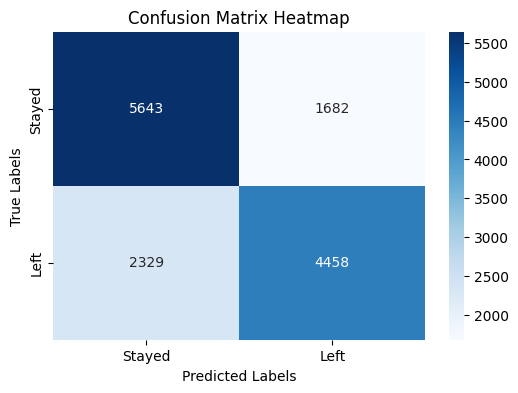

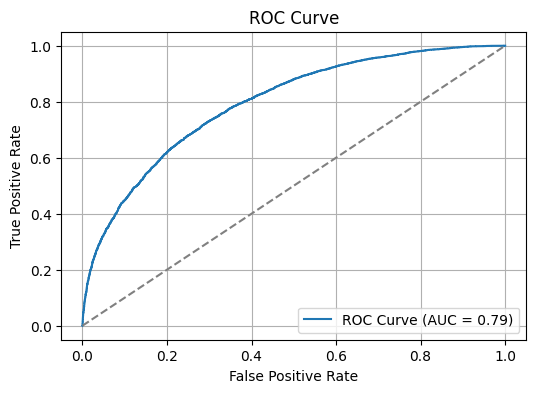

In [ ]:
# Initialize model
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

# Use the model to predict
y_pred = log_reg.predict(X_test)
y_pred_prob = log_reg.predict_proba(X_test)[:, 1]

generate_results(y_pred, y_pred_prob)

#### (b) With PCA

Test Accuracy: 73.19%
ROC-AUC Score: 81.50%
Precision: 72.51%
Recall: 71.30%
F1-Score: 71.90%


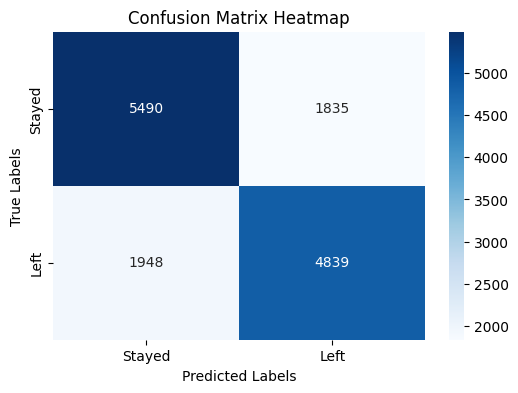

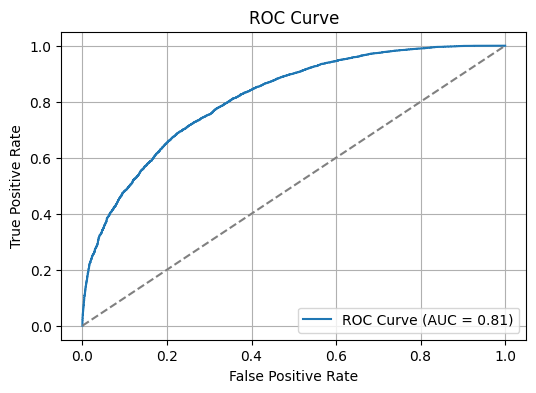

In [ ]:
# Initialize model
log_reg_pca = LogisticRegression()
log_reg_pca.fit(X_train_pca, y_train)

# Use the model to predict
y_pred = log_reg_pca.predict(X_test_pca)
y_pred_prob = log_reg_pca.predict_proba(X_test_pca)[:, 1]

generate_results(y_pred, y_pred_prob)

---
**Observations**

The logistic regression model without PCA had an accuracy of 71.58% and an ROC-AUC score of 79.40%, showing moderate performance in distinguishing between employees who stayed and those who left. The precision of 72.61% and recall of 65.68%indicate a slight imbalance. The F1-score of 68.97% suggests that there is room for improvement.

The logistic regression model using PCA achieved improved performance with an accuracy of 73.19% and a ROC-AUC score of 81.50%. The precision, recall, and F1-scores are more balanced, indicating improved performance in distinguishing between employees who stayed and those who left compared to the non-PCA model.

The improvement in performance with PCA suggests that dimensionality reduction helped mitigate potential issues such as **multicollinearity**. The balanced metrics across classes show that there is better generalization.

The slightly higher precision than recall in both models shows that they prioritize avoiding false positives, where it favors predicting someone will stay when they actually left (decreases false positives). The model with PCA does better with capturing employees who are likely to leave (decreasing false negatives). Overall, these results can be improved with more sophisticated models.

### 4.4.2 Regularized Logistic Regression

Regularization of logistic regression addressess overfitting.

- Lasso: Shrinks coefficients to zero, performing feature selection.
- Ridge: Penalizes large coefficients, effective for multicollinearity.
- Elastic Net: Balances feature selection and multicollinearity handling.


**Note:** We will perform the regularized regression using **Spark ML** to apply its learnings from class.

In [ ]:
%%capture

!apt install libkrb5-dev
!wget https://downloads.apache.org/spark/spark-3.1.2/spark-3.1.2-bin-hadoop3.2.tgz
!tar xf spark-3.1.2-bin-hadoop3.2.tgz
!pip install findspark
!pip install sparkmagic
!pip install pyspark
! pip install pyspark --quiet
! pip install imageio --quiet
! pip install folium --quiet

In [ ]:
import pyspark
from pyspark.sql import SQLContext
from pyspark.sql import SparkSession
from pyspark.sql.types import *
import pyspark.sql.functions as F
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml import Pipeline
from pyspark.mllib.evaluation import MulticlassMetrics
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import BinaryClassificationEvaluator

spark = SparkSession.builder.appName('bigdata-hw4').getOrCreate()
sqlContext = SQLContext(spark)

In [ ]:
%load_ext sparkmagic.magics

In [ ]:
import networkx as nx
import sqlite3

os.environ['SPARK_HOME'] = '/content/spark-3.1.2-bin-hadoop3.2'
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"

In [ ]:
encoded_sdf = spark.createDataFrame(encoded_df)

In [ ]:
encoded_sdf = encoded_sdf.withColumn('Attrition', F.col('Attrition').cast('double'))
encoded_sdf.printSchema()

root
 |-- Age: long (nullable = true)
 |-- Gender: long (nullable = true)
 |-- Years at Company: long (nullable = true)
 |-- Monthly Income: long (nullable = true)
 |-- Work-Life Balance: long (nullable = true)
 |-- Job Satisfaction: long (nullable = true)
 |-- Performance Rating: long (nullable = true)
 |-- Number of Promotions: long (nullable = true)
 |-- Overtime: long (nullable = true)
 |-- Distance from Home: long (nullable = true)
 |-- Number of Dependents: long (nullable = true)
 |-- Company Tenure: long (nullable = true)
 |-- Remote Work: long (nullable = true)
 |-- Leadership Opportunities: long (nullable = true)
 |-- Innovation Opportunities: long (nullable = true)
 |-- Company Reputation: long (nullable = true)
 |-- Employee Recognition: long (nullable = true)
 |-- Job Role_Education: long (nullable = true)
 |-- Job Role_Finance: long (nullable = true)
 |-- Job Role_Healthcare: long (nullable = true)
 |-- Job Role_Media: long (nullable = true)
 |-- Job Role_Technology: long 

In [ ]:
# Setup Vector Assembler
all_columns = encoded_sdf.columns
drop_columns = ['Attrition']
feature_columns = [col for col in all_columns if col not in drop_columns]
vector_assembler = VectorAssembler(inputCols=feature_columns, outputCol="features")

In [ ]:
# Standard Scaling since regularized regression models are not scale invariant
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures", withStd=True, withMean=True)

# Pipeline and Train/Test Split
random_seed = 42
pipeline = Pipeline(stages=[vector_assembler, scaler])
processed_encoded_sdf = pipeline.fit(encoded_sdf).transform(encoded_sdf)

# Do 80/20 train-test split
train_sdf, test_sdf = processed_encoded_sdf.randomSplit([0.8, 0.2], seed=random_seed)

#### (a) Lasso

Test Accuracy: 65.93%
Precision: 73.90%
Recall: 43.40%
F1-Score: 54.68%
ROC-AUC Score: 75.55%


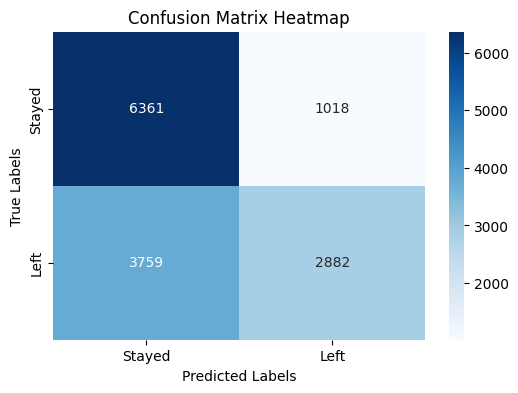

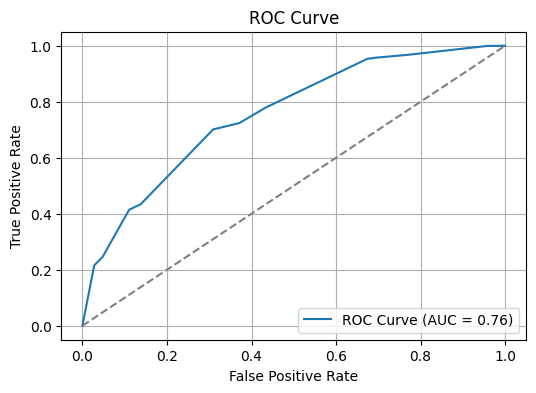

In [ ]:
# Instantiate LASSO/L1
l1_model = LogisticRegression(maxIter=100, regParam=0.1, elasticNetParam=1.0, labelCol="Attrition", featuresCol="scaledFeatures")

# Fit and Transform
l1_model_fitted = l1_model.fit(train_sdf)
l1_predictions = l1_model_fitted.transform(test_sdf)

generate_results_spark(l1_predictions)

#### (b) Ridge

Test Accuracy: 74.44%
Precision: 73.54%
Recall: 71.92%
F1-Score: 72.72%
ROC-AUC Score: 83.21%


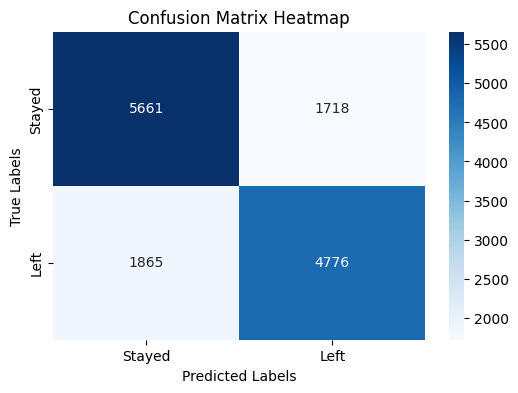

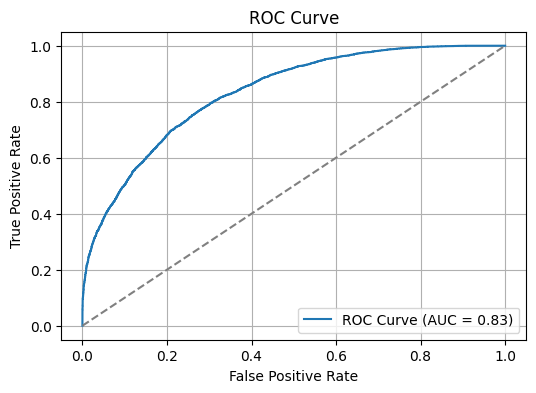

In [ ]:
# Instantiate Ridge/L2
l2_model = LogisticRegression(maxIter=100,regParam=0.1, elasticNetParam=0.0, labelCol="Attrition", featuresCol="scaledFeatures")

# Fit and Transform
l2_model_fitted = l2_model.fit(train_sdf)
l2_predictions = l2_model_fitted.transform(test_sdf)

generate_results_spark(l2_predictions)

#### (c) Elastic Net

Test Accuracy: 70.69%
Precision: 70.37%
Recall: 65.86%
F1-Score: 68.04%
ROC-AUC Score: 79.54%


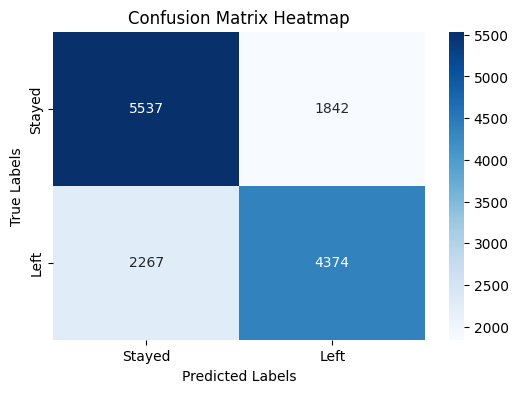

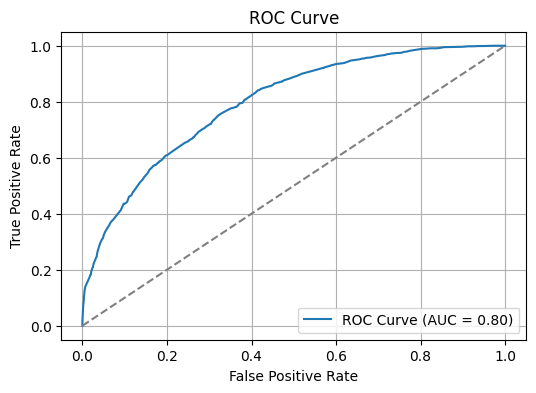

In [ ]:
# Instantiate Elastic Net
en_model = LogisticRegression(maxIter=100,regParam=0.1, elasticNetParam=0.5, labelCol="Attrition", featuresCol="scaledFeatures")

# Fit and Transform
en_model_fitted = en_model.fit(train_sdf)
en_predictions = en_model_fitted.transform(test_sdf)

generate_results_spark(en_predictions)

---
**Observations**

Ridge regression has the highest test accuracy (74.44%) and ROC-AUC score (83.21%), outperforming the PCA enhanced logistic regression accuracy/ROC-AUC score. Ridge's mostly balanced precision and recall show that it does not overfit and handles multicollinearity better than the baseline regression.

Lasso regression, however, shows a worse performance, with a lower test accuracy (65.93%) and F1-score (54.68%). This could be because its feature selection bias, which can oversimplify the model. This model misses many of employees who actually leave (with a lower recall vs. precision), which makes it not ideal for our purposes.

Elastic Net finds a balance between Ridge and Lasso, but its performance is still below Ridge.

Overall, these results suggest that Ridge regularization provides the best trade-off between complexity and generalization. For this reason, we will tune the Ridge model.

#### Hyperparameter Tuning of Ridge

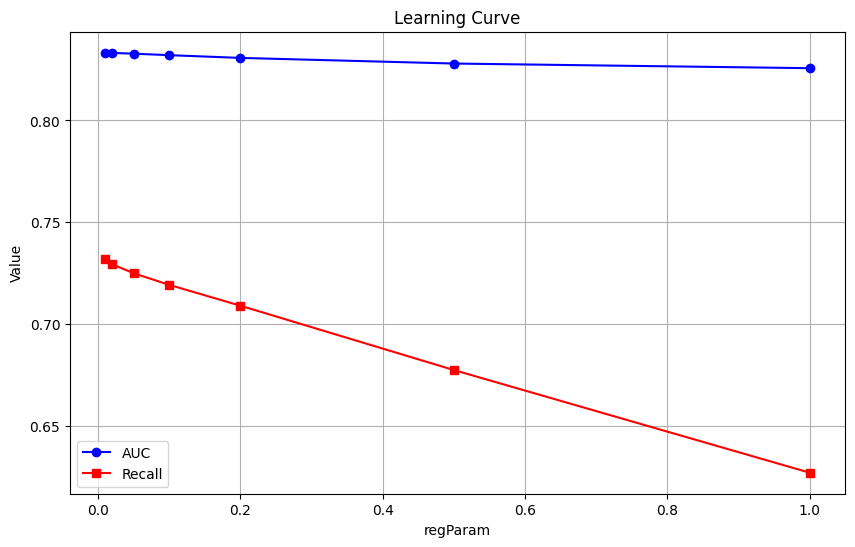

In [ ]:
# Range of regParam values for hyperparameter tuning
reg_params = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1.0]


performance_metrics = []
evaluator_auc = BinaryClassificationEvaluator(labelCol="Attrition", rawPredictionCol="rawPrediction", metricName="areaUnderROC")

for reg_param in reg_params:
    l2_model = LogisticRegression(maxIter=100, regParam=reg_param, elasticNetParam=0.0, labelCol="Attrition", featuresCol="scaledFeatures")
    l2_model_fitted = l2_model.fit(train_sdf)
    l2_predictions = l2_model_fitted.transform(test_sdf)

    # Calc auc
    auc = evaluator_auc.evaluate(l2_predictions)

    # Calc recall
    prediction_and_labels = l2_predictions.select("prediction", "Attrition").rdd
    metrics = MulticlassMetrics(prediction_and_labels)
    recall = metrics.recall(1)

    performance_metrics.append((reg_param, auc, recall))

# Dataframe of results
results_df = pd.DataFrame(performance_metrics, columns=['regParam', 'AUC', 'Recall'])

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.plot(results_df['regParam'], results_df['AUC'], marker='o', linestyle='-', color='b', label='AUC')
plt.plot(results_df['regParam'], results_df['Recall'], marker='s', linestyle='-', color='r', label='Recall')
plt.title('Learning Curve')
plt.xlabel('regParam')
plt.ylabel('Value')
plt.grid(True)
plt.legend()
plt.show()

**Observations:** Since recall drops more significantly as the regParam is increased, we will tune according to recall, especially since we want recall to be higher.

Best Regularization Parameter: 0.01
Test Accuracy: 74.59%
Precision: 73.19%
Recall: 73.17%
F1-Score: 73.18%
ROC-AUC Score: 83.33%


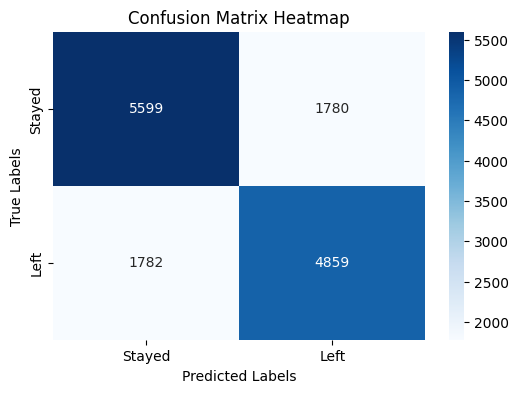

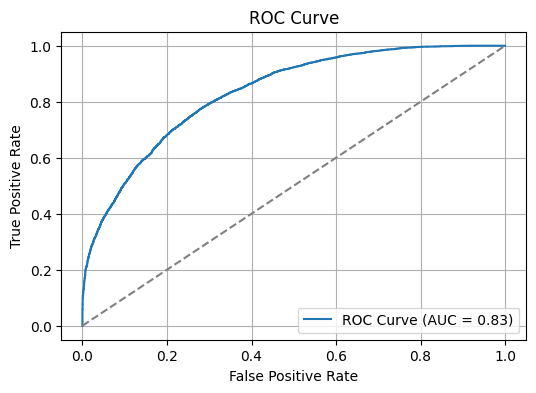

In [ ]:
# Find the best regParam to model with
best_reg_param = results_df.loc[results_df['Recall'].idxmax(), 'regParam']
print("Best Regularization Parameter:", best_reg_param)

# Instantiate Ridge/L2
l2_model = LogisticRegression(maxIter=100,regParam=best_reg_param, elasticNetParam=0.0, labelCol="Attrition", featuresCol="scaledFeatures")

# Fit and Transform
l2_model_fitted = l2_model.fit(train_sdf)
l2_predictions = l2_model_fitted.transform(test_sdf)

generate_results_spark(l2_predictions)

**Observations:** From the results, the best regParam is 0.01 results in slightly higher performance than the original Ridge model. Most notably, the recall is higher (73.17% vs. 71.92%), which is more ideal for identifying at-risk employees.

## **4.5: Tree-Based Models**

### 4.5.1 Decision Trees

Decision Trees are intuitive and interpretable, making them a good place to start for tree-based models. They're useful for capturing non-linear relationships with high interpretability.

Test Accuracy: 66.60%
ROC-AUC Score: 66.55%
Precision: 65.29%
Recall: 65.23%
F1-Score: 65.26%


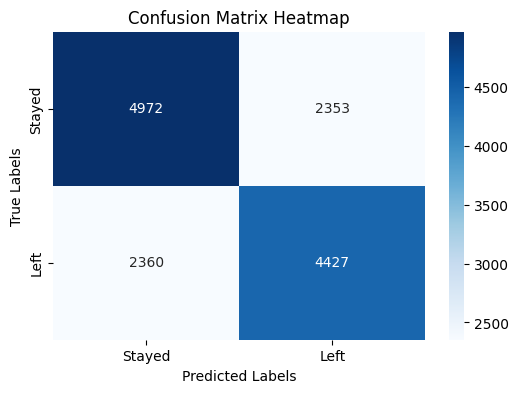

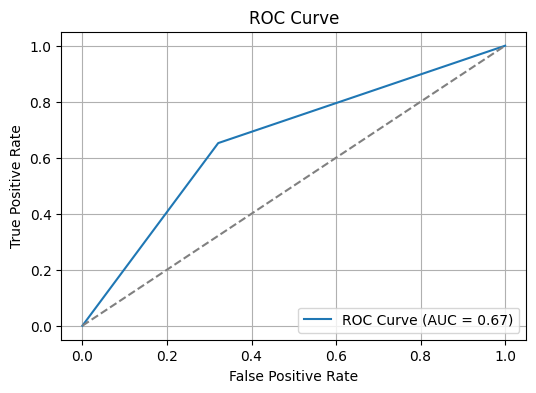

In [ ]:
# Initialize model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Use the model to predict
y_pred = dt_model.predict(X_test)
y_pred_prob = dt_model.predict_proba(X_test)[:, 1]

generate_results(y_pred, y_pred_prob)

---
**Observations**

The decision tree model achieved a test accuracy of 66.60% and a ROC-AUC score of 66.55%, indicating a relatively moderate ability to distinguish between employees who stayed and those who left. The precision and recall perform fairly evenly. The F1-score of 65.26% reflects this balance. Overall, the decision tree model shows adequate performance, but it falls behind the logistic regression model with PCA and regularized regression, which demonstrated better accuracy, ROC-AUC, and more balanced precision-recall metrics.

### 4.5.2 Random Forest Classifier

The Random Forest Classifier improves over decision trees by reducing overfitting through averaging multiple trees using ensemble learning. It provides feature importance, helping interpretability.

Test Accuracy: 74.57%
ROC-AUC Score: 66.55%
Precision: 74.28%
Recall: 72.11%
F1-Score: 73.18%


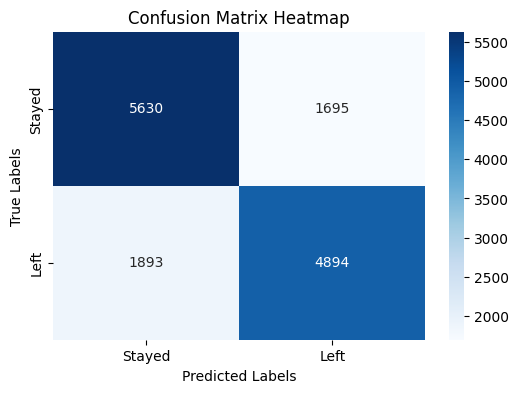

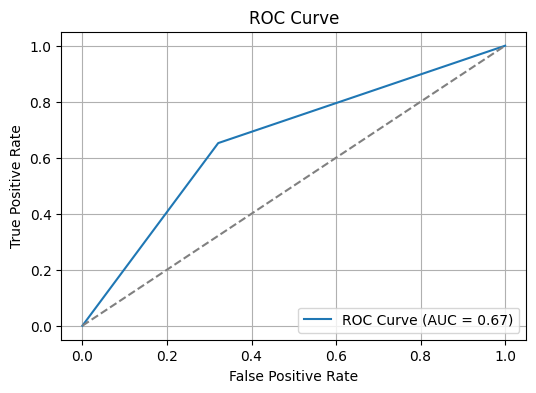

In [ ]:
# Initialize model with default parameters and fit it on the training set
rf_model = RandomForestClassifier(
    class_weight='balanced',
    n_estimators=120,
    max_depth=30,
    random_state=42
)

rf_model.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_model.predict(X_test)

generate_results(y_pred, y_pred_prob)

---
**Observations**

The Random Forest model had a test accuracy of 74.57%, matching the Ridge regression model and outperforming other models. However, the ROC-AUC score of 66.55% is surprisingly lower than expected for such accuracy. The precision of 74.28% and recall of 72.11% suggest the model is performing fairly well in identifying both employees who stayed and those who left. The F1-score of 73.18% indicates a good balance between precision and recall. Overall, the random forest classifier shows strong performance, slightly outperforming both the logistic regression and decision tree models, especially in terms of test accuracy and recall.

Compared to the decision tree, the random forest mitigates overfitting and captures more complex relationships, but its low ROC-AUC score suggests potential improvements in hyperparameter tuning.

#### Hyperparameter Tuning of Random Forest

**Note:** Takes about 7 minutes to run, feel free to skip the cell below

In [ ]:
param_dist = {
    'n_estimators': randint(100, 200),
    'max_depth': randint(20, 50),
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Initialize model
new_rf_model = RandomForestClassifier(
    class_weight='balanced',
    random_state=42
)

# Perform random search
random_search = RandomizedSearchCV(
    estimator=new_rf_model,
    param_distributions=param_dist,
    n_iter=10,
    scoring='roc_auc',
    cv=3,
    verbose=2,
    n_jobs=-1,
    random_state=42
)

# Fit model
random_search.fit(X_train, y_train)

# Print best parameters
print("Best Parameters:", random_search.best_params_)

# Evaluate best model
best_rf_model = random_search.best_estimator_
y_pred = best_rf_model.predict(X_test)
y_pred_prob = best_rf_model.predict_proba(X_test)[:, 1]

Fitting 3 folds for each of 10 candidates, totalling 30 fits


Test Accuracy: 74.75%
ROC-AUC Score: 83.99%
Precision: 73.49%
Recall: 74.30%
F1-Score: 73.90%


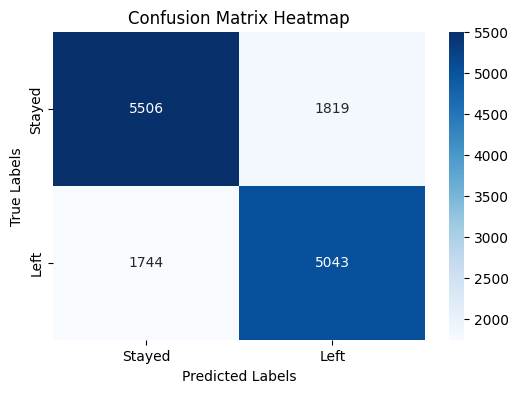

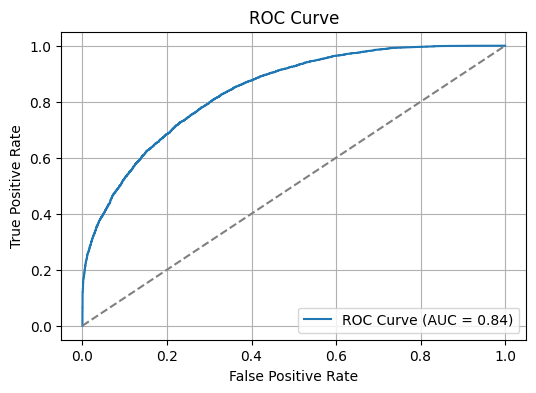

In [ ]:
''' Using the results from the hyperparameter tuning above, we will use the following parameters '''

# Initialize Random Forest model with the parameters
new_rf_model = RandomForestClassifier(
    max_depth=42,
    min_samples_leaf=4,
    min_samples_split=10,
    n_estimators=187,
    class_weight='balanced',
    random_state=42
)

# Fit model
new_rf_model.fit(X_train, y_train)

# Predict
y_pred = new_rf_model.predict(X_test)
y_pred_prob = new_rf_model.predict_proba(X_test)[:, 1]

generate_results(y_pred, y_pred_prob)

---
**Observations**

After tuning the hyperparameters of the Random Forest classifier, the model achieved a test accuracy of 74.75%, with a significant improvement in the ROC-AUC score, which rose to 83.99%. The precision, recall, and F1-score also saw noticeable enhancements, with precision at 73.49%, recall at 74.30%, and F1-score at 73.90%. These results indicate a more balanced performance compared to the earlier model. The improvements suggest that the tuned model has become better at distinguishing between the classes and is more consistent in its predictions. Additionally, it is better at identifying at-risk employees (with a higher recall), which is vital for comapnies to take action for these workers.

#### Feature Importance

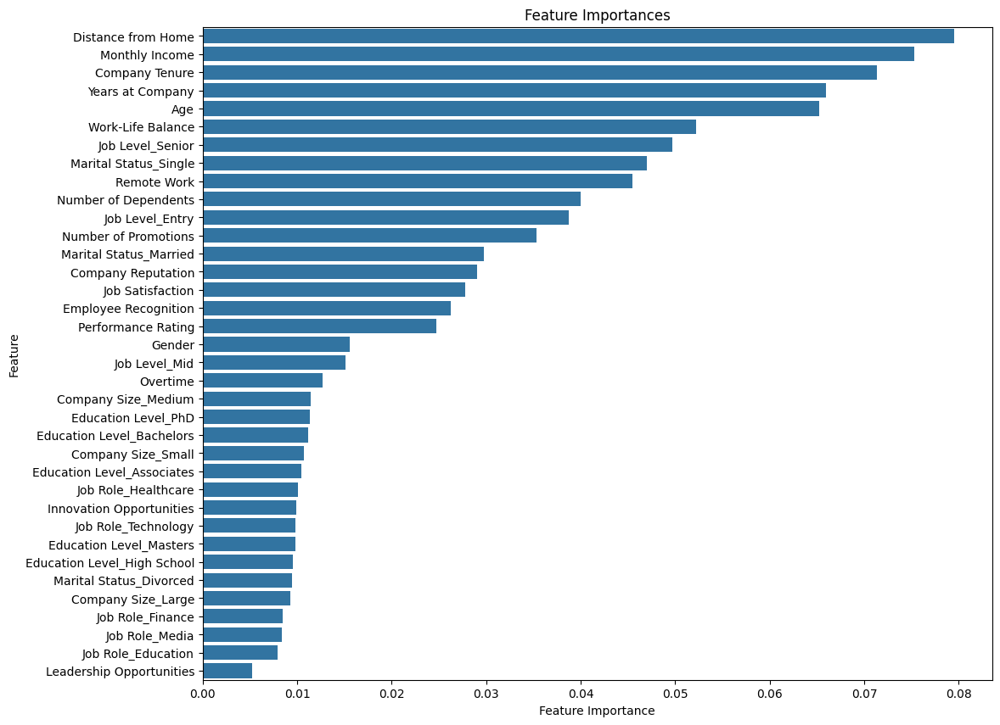

In [ ]:
# Get feature importnce using built-in feature importance
feature_importances = rf_model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Feature Importance': feature_importances
})

# Visualize the feature importances using a barplot
feature_importance_df = feature_importance_df.sort_values(by='Feature Importance', ascending=False)
plt.figure(figsize=(12, 10))
sns.barplot(x='Feature Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.show()

---
**Observations**
- The most important features are `Distance from Home`, `Monthly Income`, `Company Tenure`, `Years at Company`, and `Age`.
- Features like `Leadership Opportunities` and `Job_Role` contribute minimally and could be considered for removal.
- Features such as `Company Tenure` and `Years at Company` are likely correlated with each other. Keeping both in the model could introduce multicollinearlity.




### 4.5.3: XGBoost

XGBoost takes advantage of gradient boosting for better performance. It is highly accurate and robust, often outperforming Random Forests. We will demonstrate how boosting can correct errors from previous models through tuning and optimizing performance.

Test Accuracy: 75.91%
ROC-AUC Score: 84.97%
Precision: 75.08%
Recall: 74.70%
F1-Score: 74.89%


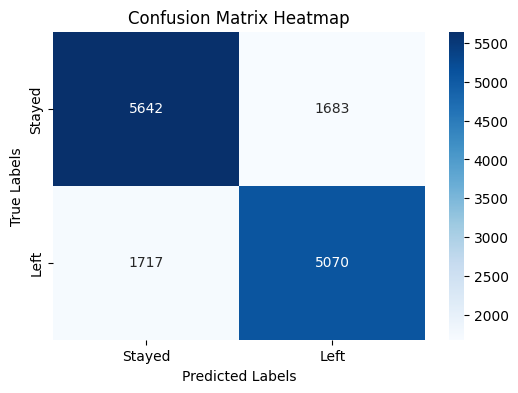

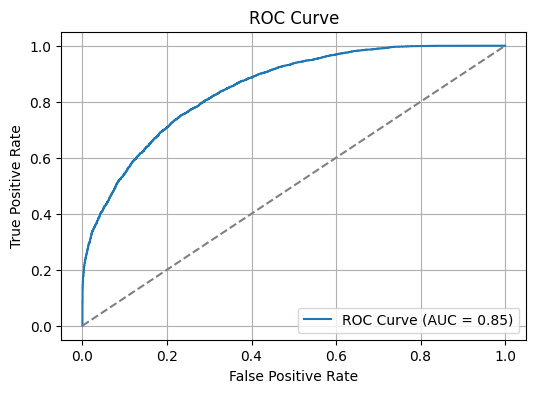

In [ ]:
# create DMatrix for XGBoost
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# set parameters for XGBoost
params = {
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'max_depth': 6,
    'eta': 0.1,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'seed': 42
}

num_round = 100
bst = xgb.train(params, dtrain, num_round)

preds = bst.predict(dtest)

y_pred = [1 if pred > 0.5 else 0 for pred in preds]
y_pred_prob = bst.predict(dtest)

generate_results(y_pred, y_pred_prob)

In [ ]:
# Cross-validation using StratifiedKFold
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_results = cross_val_score(xgb.XGBClassifier(**params), X_train, y_train, cv=kfold, scoring='accuracy')

print(f"Cross-Validation Accuracy: {np.mean(cv_results):.2%} (+/- {np.std(cv_results):.2%})")

Cross-Validation Accuracy: 75.45% (+/- 0.31%)


---
**Observations**

The XGBoost model has a test accuracy of 75.91%, with a ROC-AUC score of 84.97%. The precision is 75.08%, the recall is 74.70%, and the F1-score is 74.89%. These results indicate strong performance, especially with a high ROC-AUC score, suggesting that the model does well in distinguishing between the classes.

When comparing these results to the hyperparametized Random Forest classifier, we see that XGBoost shows a slight improvement in performance. XGBoost achieves a higher precision and recall, making it a more balanced model compared to the Random Forest.

Overall, the XGBoost model appears to outperform the Random Forest model in terms of the key performance metrics, suggesting it may better capture the underlying patterns in the data.

#### Hyperparameter Tuning of XGBoost

Fitting 3 folds for each of 25 candidates, totalling 75 fits
Best parameters: {'subsample': 0.8, 'seed': 42, 'objective': 'binary:logistic', 'n_estimators': 150, 'max_depth': 3, 'learning_rate': 0.1, 'gamma': 0, 'eval_metric': 'logloss', 'colsample_bytree': 0.6}
Best cross-validation accuracy: 75.69%
Test Accuracy: 75.94%
ROC-AUC Score: 83.99%
Precision: 75.17%
Recall: 74.61%
F1-Score: 74.89%


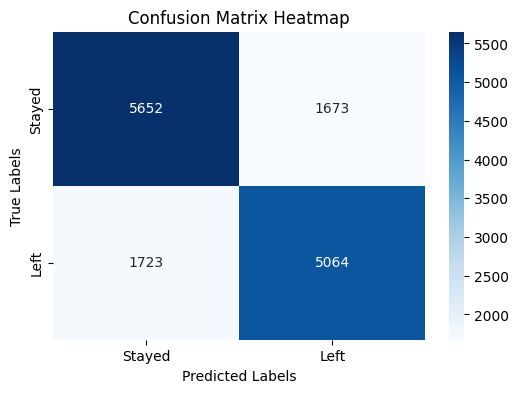

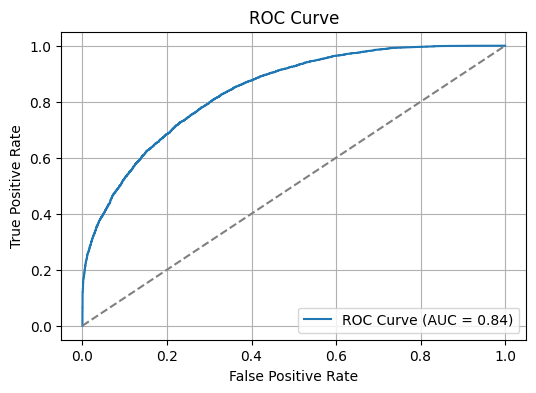

In [ ]:
param_grid = {
    'objective': ['binary:logistic'],
    'eval_metric': ['logloss'],
    'max_depth': [3, 4, 5, 6, 7],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.7, 0.8, 0.9],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9],
    'n_estimators': [50, 100, 150],
    'gamma': [0, 1, 5],
    'seed': [42]
}

# Initialize the XGBClassifier
xgb_model = xgb.XGBClassifier()

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_grid,
    n_iter=25,
    scoring='accuracy',
    cv=3,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Fit model
random_search.fit(X_train, y_train)

# Best parameters and accuracy
print("Best parameters:", random_search.best_params_)
print(f"Best cross-validation accuracy: {random_search.best_score_:.2%}")

# Generate results of the hyperparametized model
best_params = random_search.best_params_
best_model = xgb.XGBClassifier(**best_params)
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)
y_pred_prob = new_rf_model.predict_proba(X_test)[:, 1]
generate_results(y_pred, y_pred_prob)

---
**Observations**

The hyperparameterized XGBoost model showed slight improvements in some metrics compared to the baseline XGBoost model. While the test accuracy increased marginally, the ROC-AUC score saw a small decline, indicating a minor trade-off in the model's ability to distinguish between classes.

## **4.6: Advanced/Non-linear Models**

### 4.6.1 Neural Nets

Neural Nets show the application of deep learning to structured data. We will use a fully connected neural network to attempt to predict attrition.

We created two models - one basic and one advanced to compare the performance and see if we could get higher accuracy. The basic model simply consists of four fully connected layers using the ReLU activation function after each. For the advanced model, we added another fully connected layer and experimented with dropout, which randomly deletes some connections between a layer and the next to prevent overfitting. The training data for the advanced model has been retained below for observation purposes.

In [ ]:
''' Helper function to calculate metrics on testing data'''

def evaluate_FCNN_model(model):
    total = 0
    correct = 0
    y_true = []
    y_pred = []
    y_scores = []

    model.eval()
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device).float()
            preds = model(inputs)
            predicted = (torch.sigmoid(preds) > 0.5).float()

            # true labels and predictions for metric calculation
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predicted.cpu().numpy())
            y_scores.extend(torch.sigmoid(preds).cpu().numpy())

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    # calc metrics
    test_acc = correct / total
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    roc_auc = roc_auc_score(y_true, y_scores)

    # print metrics
    print(f"Test Accuracy: {test_acc:.2%}")
    print(f"Precision: {precision:.2%}")
    print(f"Recall: {recall:.2%}")
    print(f"F1-Score: {f1:.2%}")
    print(f"ROC-AUC Score: {roc_auc:.2%}")

In [ ]:
# split the training data into training and validation sets
X_train_new, X_val, y_train_new, y_val = train_test_split(X_train_pca, y_train, test_size=0.1, random_state=42)

# convert data into tensors
batch_size = 32
X_train_tensor = torch.tensor(X_train_new, dtype=torch.float32)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_new.values, dtype=torch.float32).view(-1, 1)
y_val_tensor = torch.tensor(y_val.values, dtype=torch.float32).view(-1, 1)
X_test_tensor = torch.tensor(X_test_pca, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1)

# load into DataLoaders
train_data = TensorDataset(X_train_tensor, y_train_tensor)
val_data = TensorDataset(X_val_tensor, y_val_tensor)
test_data = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_data, batch_size=batch_size)
test_loader = DataLoader(test_data, batch_size=batch_size)

#### a) Basic Model

In [ ]:
# define the model
class BasicModel(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.fc1 = nn.Linear(input_dim, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 16)
        self.fc4 = nn.Linear(16, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        return self.fc4(x)

In [ ]:
''' Declare training function '''

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.BCEWithLogitsLoss()
epoch = 30

def train(model, optimizer):
    losses_train = []
    accuracies_train = []
    losses_val = []
    accuracies_val = []
    train_size = len(train_data)
    val_size = len(val_data)

    for e in range(epoch):
        total_loss_train = 0.0
        correct_train = 0
        total_train = 0
        model.train()

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device).float()

            optimizer.zero_grad()
            preds = model(inputs)
            loss = criterion(preds, labels)
            loss.backward()
            optimizer.step()

            total_loss_train += loss.item() * len(labels)
            predicted = (torch.sigmoid(preds) > 0.5).float()
            correct_train += (predicted == labels).sum().item()
            total_train += labels.size(0)

        avg_loss_train = total_loss_train / train_size
        accuracy_train = correct_train / total_train
        losses_train.append(avg_loss_train)
        accuracies_train.append(accuracy_train)

        # Validation loop
        total_loss_val = 0.0
        correct_val = 0
        total_val = 0
        model.eval()

        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device).float()
            preds = model(inputs)
            loss = criterion(preds, labels)

            total_loss_val += loss.item() * len(labels)
            predicted = (torch.sigmoid(preds) > 0.5).float()
            correct_val += (predicted == labels).sum().item()
            total_val += labels.size(0)

        avg_loss_val = total_loss_val / val_size
        accuracy_val = correct_val / total_val
        losses_val.append(avg_loss_val)
        accuracies_val.append(accuracy_val)

        print(f"Epoch: {e + 1}, Train Loss: {avg_loss_train:.4f}, Train Accuracy: {accuracy_train:.3f}, "f"Val Loss: {avg_loss_val:.4f}, Val Accuracy: {accuracy_val:.3f}")

    return losses_train, accuracies_train, losses_val, accuracies_val

In [ ]:
# Perform training on Basic Model
basic_model = BasicModel(X_train_pca.shape[1]).to(device)
basic_optimizer = optim.Adam(basic_model.parameters(), lr=1e-4)

print("Basic Model:")
losses_train, accuracies_train, losses_val, accuracies_val = train(basic_model, basic_optimizer)

Basic Model:
Epoch: 1, Train Loss: 0.5894, Train Accuracy: 0.674, Val Loss: 0.5320, Val Accuracy: 0.729
Epoch: 2, Train Loss: 0.5278, Train Accuracy: 0.727, Val Loss: 0.5278, Val Accuracy: 0.729
Epoch: 3, Train Loss: 0.5252, Train Accuracy: 0.728, Val Loss: 0.5267, Val Accuracy: 0.731
Epoch: 4, Train Loss: 0.5235, Train Accuracy: 0.729, Val Loss: 0.5248, Val Accuracy: 0.730
Epoch: 5, Train Loss: 0.5220, Train Accuracy: 0.729, Val Loss: 0.5243, Val Accuracy: 0.732
Epoch: 6, Train Loss: 0.5208, Train Accuracy: 0.730, Val Loss: 0.5231, Val Accuracy: 0.730
Epoch: 7, Train Loss: 0.5196, Train Accuracy: 0.731, Val Loss: 0.5224, Val Accuracy: 0.730
Epoch: 8, Train Loss: 0.5187, Train Accuracy: 0.731, Val Loss: 0.5221, Val Accuracy: 0.730
Epoch: 9, Train Loss: 0.5176, Train Accuracy: 0.732, Val Loss: 0.5213, Val Accuracy: 0.730
Epoch: 10, Train Loss: 0.5169, Train Accuracy: 0.733, Val Loss: 0.5212, Val Accuracy: 0.730
Epoch: 11, Train Loss: 0.5163, Train Accuracy: 0.733, Val Loss: 0.5204, Val 

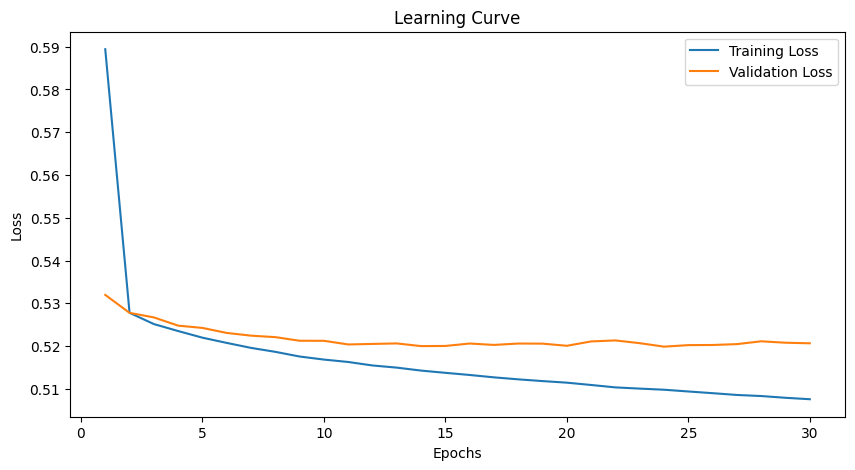

In [ ]:
# Plot Training and Validation Loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, epoch + 1), losses_train, label="Training Loss")
plt.plot(range(1, epoch + 1), losses_val, label="Validation Loss")
plt.title('Learning Curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

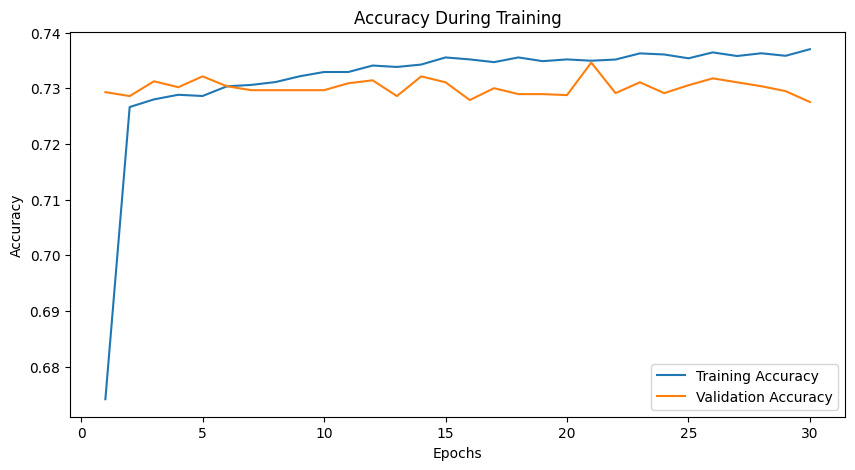

In [ ]:
# Plot Training and Validation Accuracy
plt.figure(figsize=(10, 5))
plt.plot(range(1, epoch + 1), accuracies_train, label="Training Accuracy")
plt.plot(range(1, epoch + 1), accuracies_val, label="Validation Accuracy")
plt.title('Accuracy During Training')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
# Print testing results
evaluate_FCNN_model(basic_model)

Test Accuracy: 72.74%
Precision: 70.70%
Recall: 73.96%
F1-Score: 72.30%
ROC-AUC Score: 81.59%


#### b) Advanced Model

In [ ]:
class AdvancedModel(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.dropout1 = nn.Dropout(0.1)
        # self.bn1 = nn.BatchNorm1d(128)

        self.fc2 = nn.Linear(128, 64)
        # more dropout and BatchNorm layers were tested as well
        self.fc3 = nn.Linear(64, 32)
        self.fc4 = nn.Linear(32, 16)
        self.fc5 = nn.Linear(16, 1)

    def forward(self, x):
        # x = torch.relu(self.bn1(self.fc1(x)))
        x = torch.relu(self.fc1(x))
        x = self.dropout1(x)
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        x = torch.relu(self.fc4(x))
        return self.fc5(x)

In [ ]:
# Perform training on Advanced Model
advanced_model = AdvancedModel(X_train_pca.shape[1]).to(device)
advanced_optimizer = optim.Adam(advanced_model.parameters(), lr=1e-3)

print("Advanced Model:")
losses_train_adv, accuracies_train_adv, losses_val_adv, accuracies_val_adv = train(advanced_model, advanced_optimizer)

Advanced Model:
Epoch: 1, Train Loss: 0.5357, Train Accuracy: 0.721, Val Loss: 0.5247, Val Accuracy: 0.726
Epoch: 2, Train Loss: 0.5217, Train Accuracy: 0.730, Val Loss: 0.5208, Val Accuracy: 0.728
Epoch: 3, Train Loss: 0.5179, Train Accuracy: 0.731, Val Loss: 0.5195, Val Accuracy: 0.727
Epoch: 4, Train Loss: 0.5157, Train Accuracy: 0.732, Val Loss: 0.5190, Val Accuracy: 0.727
Epoch: 5, Train Loss: 0.5136, Train Accuracy: 0.732, Val Loss: 0.5205, Val Accuracy: 0.728
Epoch: 6, Train Loss: 0.5115, Train Accuracy: 0.734, Val Loss: 0.5189, Val Accuracy: 0.729
Epoch: 7, Train Loss: 0.5101, Train Accuracy: 0.735, Val Loss: 0.5182, Val Accuracy: 0.729
Epoch: 8, Train Loss: 0.5087, Train Accuracy: 0.737, Val Loss: 0.5193, Val Accuracy: 0.723
Epoch: 9, Train Loss: 0.5068, Train Accuracy: 0.737, Val Loss: 0.5273, Val Accuracy: 0.726
Epoch: 10, Train Loss: 0.5051, Train Accuracy: 0.738, Val Loss: 0.5207, Val Accuracy: 0.725
Epoch: 11, Train Loss: 0.5030, Train Accuracy: 0.741, Val Loss: 0.5225, V

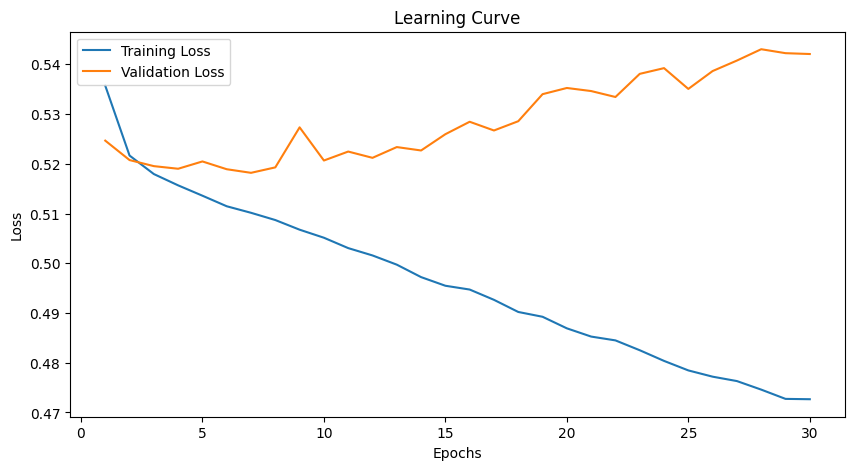

In [ ]:
# Plot Training and Validation Loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, epoch + 1), losses_train_adv, label="Training Loss")
plt.plot(range(1, epoch + 1), losses_val_adv, label="Validation Loss")
plt.title('Learning Curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

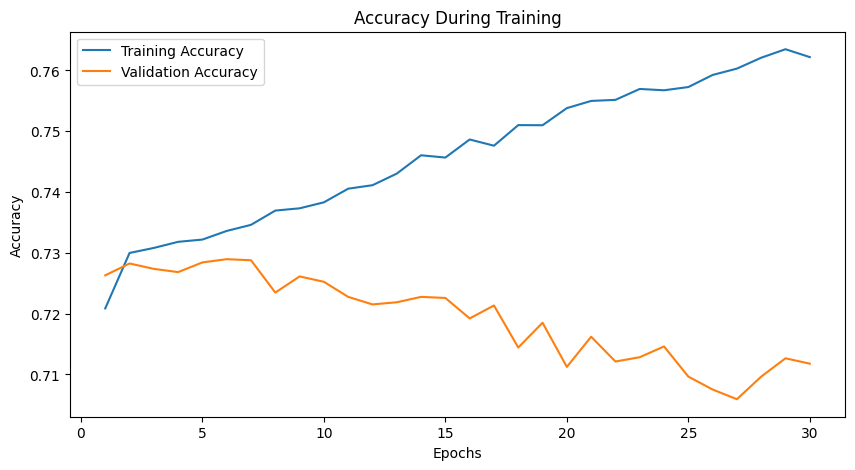

In [ ]:
# Plot Training and Validation Accuracy
plt.figure(figsize=(10, 5))
plt.plot(range(1, epoch + 1), accuracies_train_adv, label="Training Accuracy")
plt.plot(range(1, epoch + 1), accuracies_val_adv, label="Validation Accuracy")
plt.title('Accuracy During Training')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
# Print testing results
evaluate_FCNN_model(advanced_model)

Test Accuracy: 71.99%
Precision: 72.02%
Recall: 68.29%
F1-Score: 70.11%
ROC-AUC Score: 80.44%


---
**Observations**

The basic model appears to outperform the advanced one at a first glance, however, the training results indicate that the advanced model outperforms the basic model in terms of both training accuracy and faster convergence. It has higher training and validation accuracy earlier in the epochs. The validation loss and accuracy show some overfitting in the advanced model later on. Overall, while the advanced model shows better performance on training data, its generalization is not as good as the basic model during later epochs likely due to overfitting. For this reason, we should use fewer epochs when using the advanced model to achieve optimal results.

When comparing these results to the XGBoost model, XGBoost outperforms both FCNN models in all key metrics, especially with the accuracy and ROC-AUC score. While the FCNN models perform well, XGBoost is a more robust and reliable model for predicting attrition. It handles class imbalances and provides higher precision and most importantly recall. In the end, we want to identify any at-risk employees since preventing attrition is the primary goal. It is better to identify an employee as "at-risk" but actually isn't than to miss an employee who will leave (higher recall is preferred).

Overall, the **best model for predicting employee attrition is the XGBoost!**

# **Challenges Faced and Next Steps**

### Challenges Faced:
  - The sentiment analysis model may not perfectly capture nuances such as sarcasm or complex emotional states in employee reviews, leading to misclassification of sentiment.
  - The reason CareerBliss was used for this project is because it allowed for automated scraping, unlike Glassdoor or Indeed where we ran into issues getting blocked.
  - Cross-validation during hyperparameter tuning, while improving model performance, significantly increased runtime.
  - We used Randomized Search rather than Grid Search to compromize on runtime, eventhough Grid Search would provide a more optimal result.

### Next Steps:
  - Explore other sentiment analysis models, like a GPT API, to better capture the tone and sentiment of employee reviews.
  - Use an official Glassdoor or Indeed API to get a more comprehensive list of reviews across more widely used sources than CareerBliss.
  - Implement grid search using libraries like Optuna to find optimal hyperparameters more efficiently.
  - Tune models to detect at-risk employees, it is generally better to be wrong about an employee at-risk when they are not than to lose an employee due to missclassification **(tune further for higher recall)**.
  - Make use of Dask for EDA and model training for increased efficiency.
  - Investigate further into deep learning techniques, like convolutional neural networks to avoid the overfitting happining with FCNNs
  - Develop dashboards or summary reports that focus on key insights and metrics, making results more accessible to non-technical stakeholders.